In [1]:
import sys
sys.path.insert(0, '..')  # Adding parent folder so notebook find perturbseq_analysis.py
import perturbseq_analysis as pseq
from scipy.io import mmread
import pandas as pd
import xlrd

In [2]:
# Fetching the matrix counts; rows are cells and columns are genes
matrix = mmread('GSE161824_A549_KRAS.rawcounts.matrix.mtx')  # This file was too big to be stores in GitHub; please download it from https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE161824
matrix = matrix.todense()
matrix = pd.DataFrame(matrix)
matrix

,0,1,2,3,4,5,6,7,8,9,...,24481,24482,24483,24484,24485,24486,24487,24488,24489,24490
0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150039,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
150040,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
150041,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
150042,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [3]:
# Loading the metadata with the variants assigned to each cell (rows)
obs_names = pd.read_csv('GSE161824_A549_KRAS.variants2cell.csv', sep = '\t')['variant']
obs_names

0         unassigned
1               T50T
2         unassigned
3         unassigned
4              T127T
             ...    
150039         M170L
150040          Q99E
150041          G13R
150042         Y166H
150043          T20R
Name: variant, Length: 150044, dtype: object

In [4]:
# Loading the metadata with the batches that each cell belongs to
batch_nums = pd.read_csv('GSE161824_A549_KRAS.variants2cell.csv', sep = '\t')['batch']
batch_nums

0          0
1          0
2          0
3          0
4          0
          ..
150039    31
150040    31
150041    31
150042    31
150043    31
Name: batch, Length: 150044, dtype: int64

In [5]:
# Filtering cells without an unique variant
len_index = len(matrix.index)
matrix = matrix[obs_names != 'multiple']    # Filtering cells annotated with multiple variants
matrix = matrix[obs_names != 'unassigned']  # Filtering cells with no variant annotation
matrix = matrix.reset_index(drop=True)
obs_names, batch_nums = zip(*[(variant, batch) for variant, batch in zip(obs_names, batch_nums) if variant not in ['multiple', 'unassigned']])
print('The %.2f%% of cells were filtered' % (len(matrix.index) / len_index * 100))  # Filtering list of variants

/tmp/ipykernel_18480/723879160.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  matrix = matrix[obs_names != 'unassigned']  # Filtering cells with no variant annotation


The 68.49% of cells were filtered


In [6]:
# Loading the metadata with the genes (HGNC nomenclature) assigned to each column
var_names = pd.read_csv('GSE161824_A549_KRAS.rawcounts.genes.csv', header = None)[0]
var_names

0        RP11-34P13.7
1        RP11-34P13.8
2          FO538757.3
3          FO538757.2
4          AP006222.2
             ...     
24486      AC007325.2
24487      AL354822.1
24488      AC023491.2
24489      AC004556.1
24490      AC240274.1
Name: 0, Length: 24491, dtype: object

In [7]:
# Fetching the names of mitochondrial genes (downloaded from MitoCarta3.0 database)
mt_names = pd.read_excel('../Human.MitoCarta3.0.xls', 'A Human MitoCarta3.0')['Symbol']
mt_names

0                CYC1
1                SDHB
2                COQ7
3                SDHA
4              UQCRC1
            ...      
1131            NAT8L
1132            MCCD1
1133          PIGBOS1
1134             HTD2
1135    RP11_469A15.2
Name: Symbol, Length: 1136, dtype: object

Generating metadata...


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


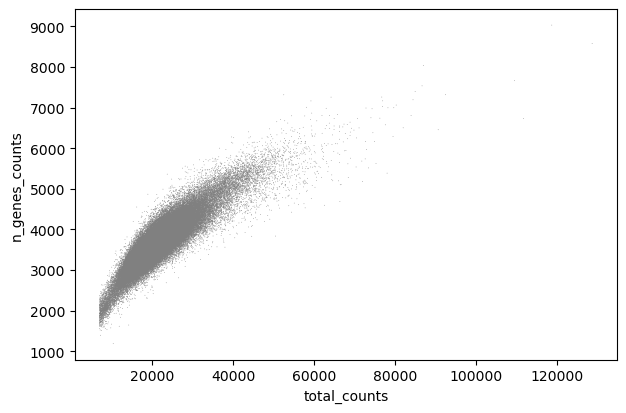

Introduce the minimum number of counts that cells must have:  7000
Introduce the maximum number of counts that cells must have:  50000
Introduce the median number of counts that batches must have:  20000


Downsampling cells with >50000 counts...
Downsampling batches...


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Filtering cells with <7000 counts...
Filtering cells with >20% mitochondrial counts...
Filtering cells with <200 genes


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:139: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Filtering genes present in <3 cells
Filtering 80% lowest variable genes


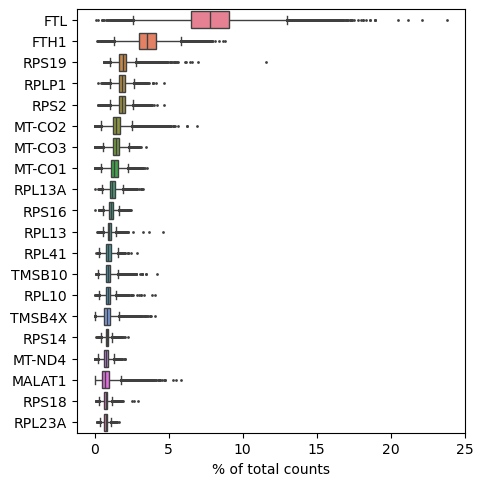

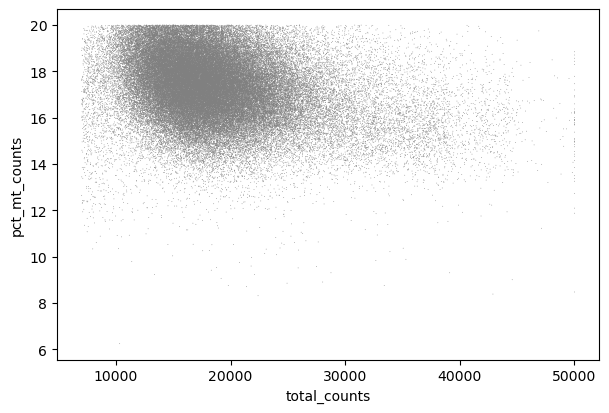

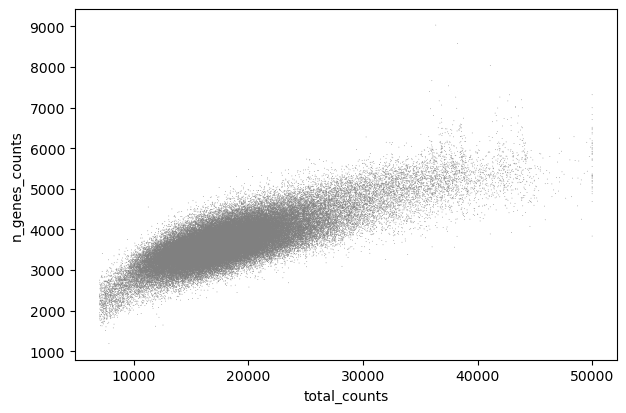

Execution time: 286.309 seconds


In [8]:
# Filtering data; check the documentation for more info
adata = pseq.filter_data(matrix, var_names, obs_names, mt_names, batch_nums)

In [3]:
##### CHECKPOINT: Recover output from previous function in order to avoid running it again #####
"""
import pickle as pkl
with open('./results/filter_data.pkl', 'rb') as file:
    adata = pkl.load(file)
"""

"\nimport pickle as pkl\nwith open('./results/filter_data.pkl', 'rb') as file:\n    adata = pkl.load(file)\n"

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n is deprecated and will be removed in Python 3.14; use value instead
  return node.n
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


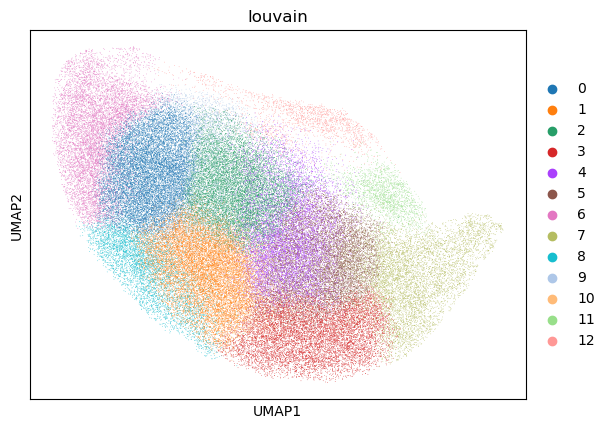

,0,1,2,3,4,5,6,7,8,9,10,11,12
K117N,13.05,3.52,13.71,3.66,14.62,11.62,10.97,7.44,2.09,12.01,4.31,1.83,1.17
R135T,13.39,15.57,8.87,13.91,9.04,7.91,7.57,10.0,4.78,2.7,2.7,1.83,1.74
A146V,14.97,7.64,13.77,7.14,11.06,9.05,9.45,8.64,3.12,9.25,3.22,1.11,1.61
T158T,13.38,14.49,8.58,11.84,10.38,7.89,8.66,7.29,5.83,3.09,3.52,2.74,2.32
S17S,12.34,13.9,9.98,13.08,9.09,9.61,9.39,6.65,7.69,2.73,2.51,1.4,1.63
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q61R,15.33,5.15,17.62,4.0,11.78,10.3,10.53,4.58,1.95,11.9,4.12,1.49,1.26
T20R,16.02,10.39,11.44,10.74,6.16,11.09,9.33,8.27,6.51,3.17,2.99,1.94,1.94
R41K,15.0,12.38,10.45,9.94,9.1,11.63,9.01,7.33,5.48,2.86,3.29,2.11,1.43
V112I,13.06,15.23,10.45,11.8,8.02,9.19,7.84,8.56,6.49,2.34,3.15,2.16,1.71


Execution time: 186.187 seconds


In [13]:
# Louvain clustering of cells, and calculate the variant presence (%) in each louvain group
adata = pseq.louvain_cells(adata)

The phenotypic impact of variants is complex and may not result in distinct clusters in the single-cell RNA-seq data. Instead, the functional impact may manifest as a spectrum of gene expression changes, making it challenging to define clear boundaries between clusters. Shall we continue with further network propagation exploration? Of course, "Genetic variants or mutations that otherwise would not pass a test for statistical significance, due to low power of association with the disease phenotype, can be prioritized due to their close association with each other in molecular networks".

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


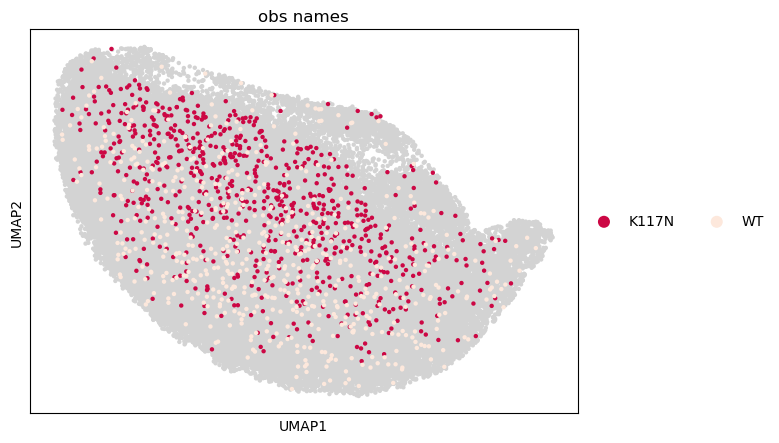

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


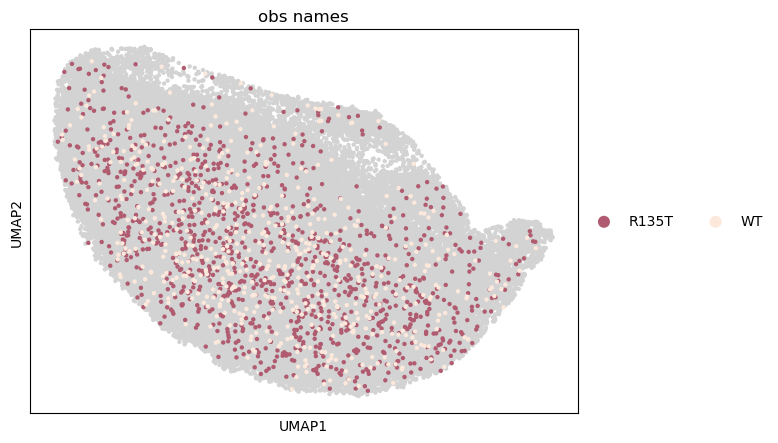

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


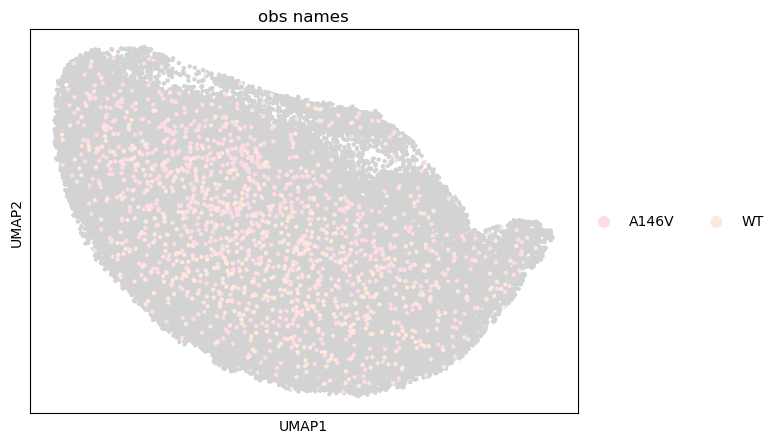

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


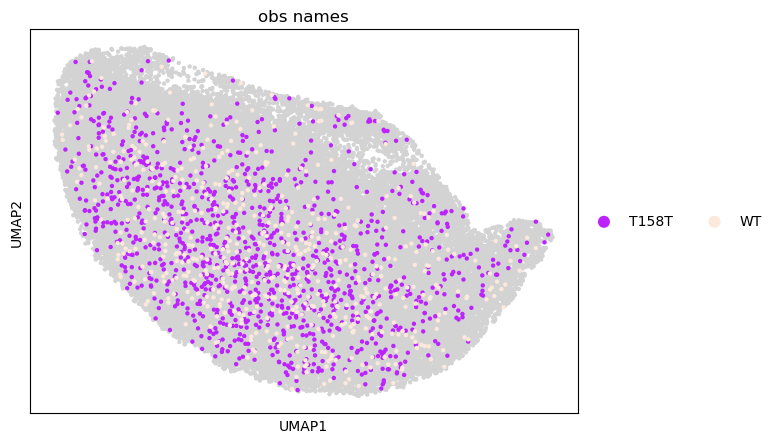

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


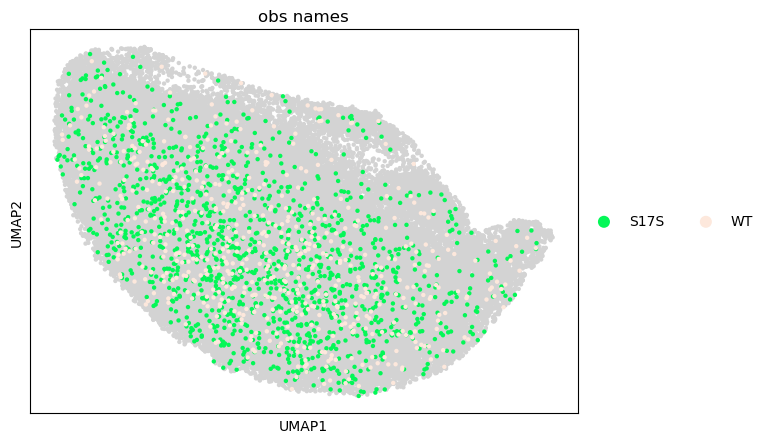

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


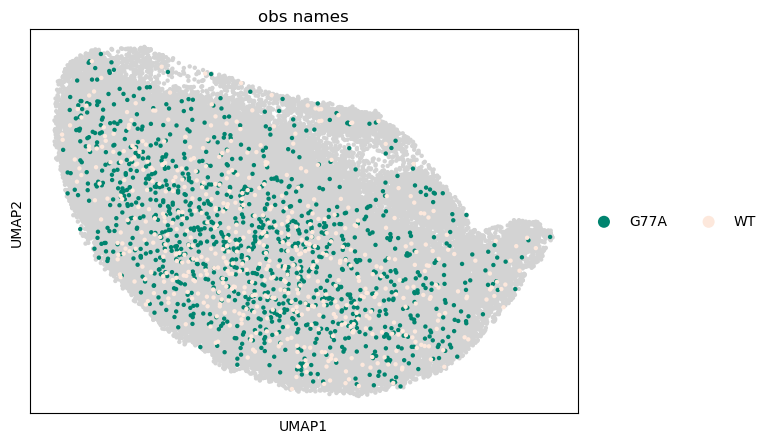

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


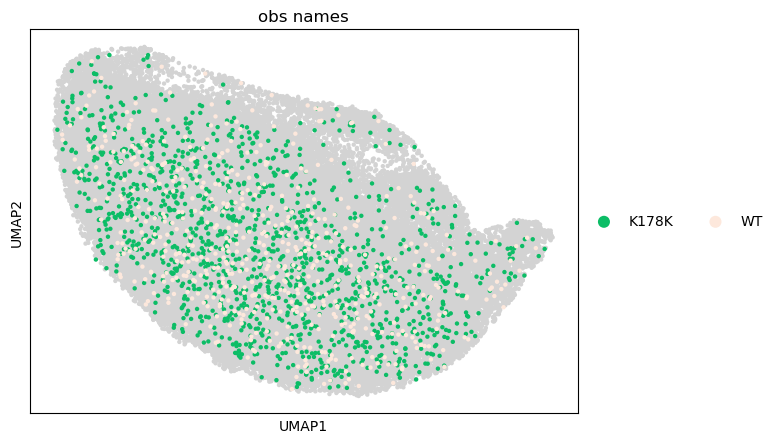

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


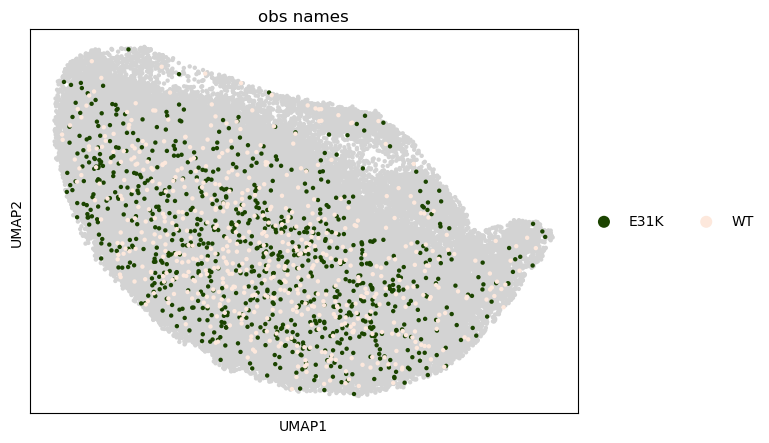

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


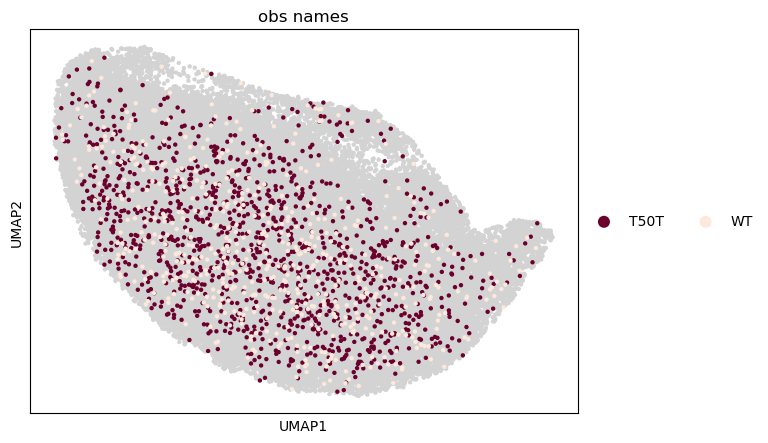

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


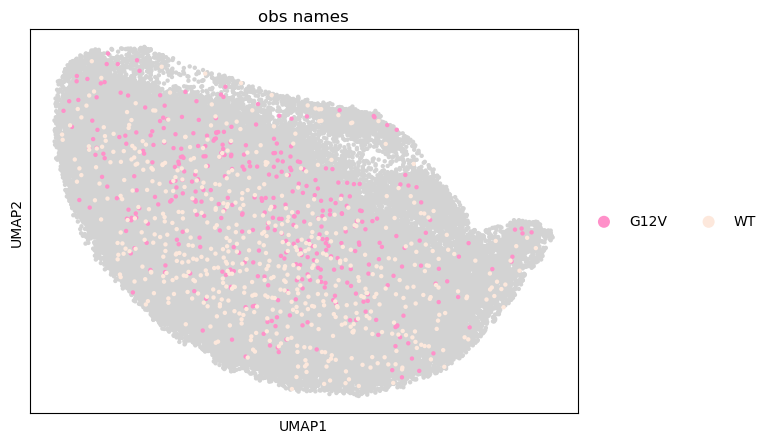

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


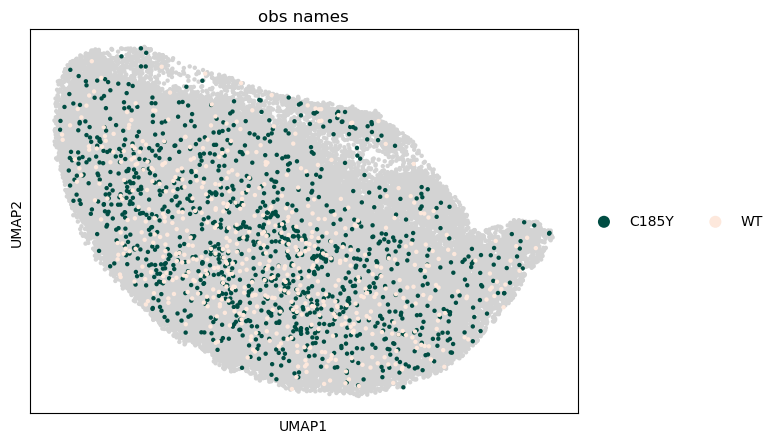

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


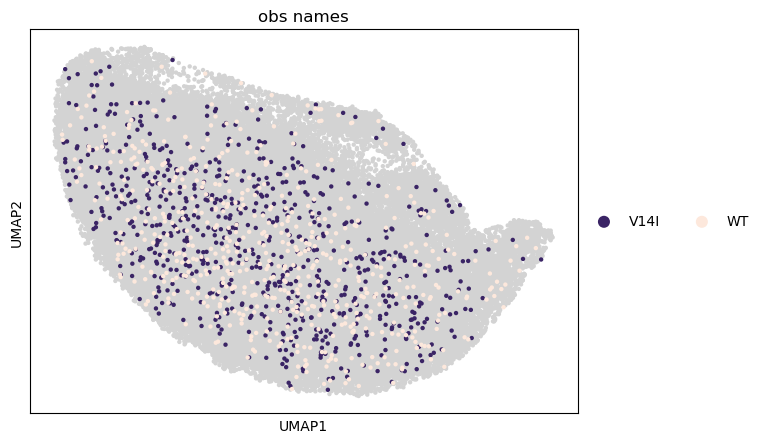

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


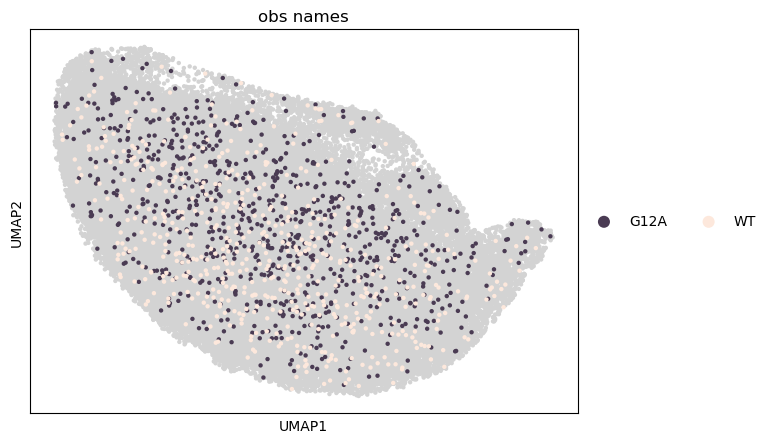

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


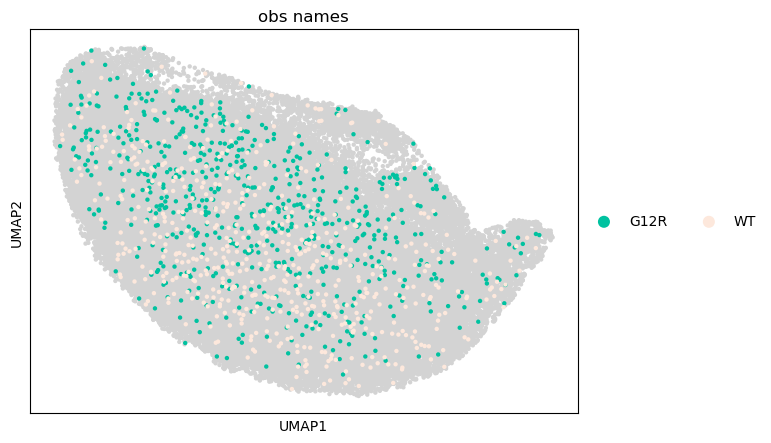

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


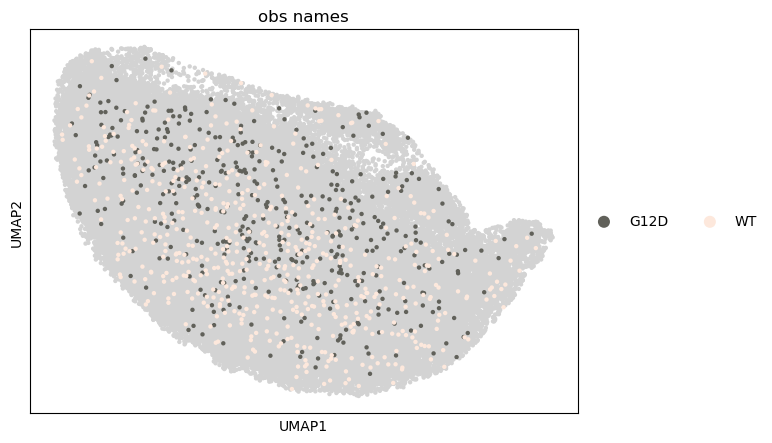

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


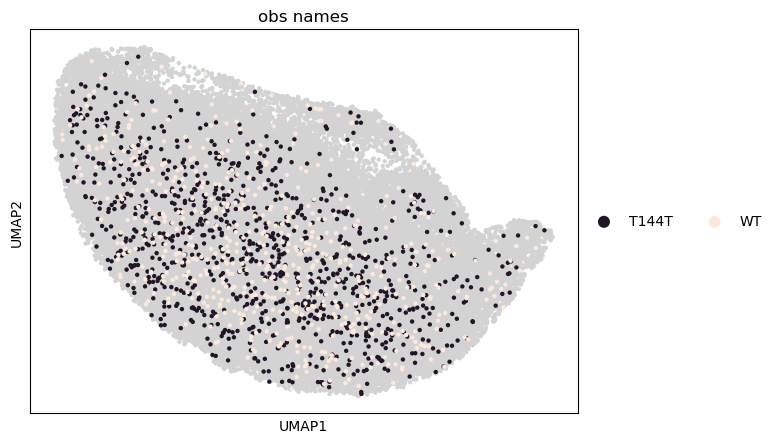

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


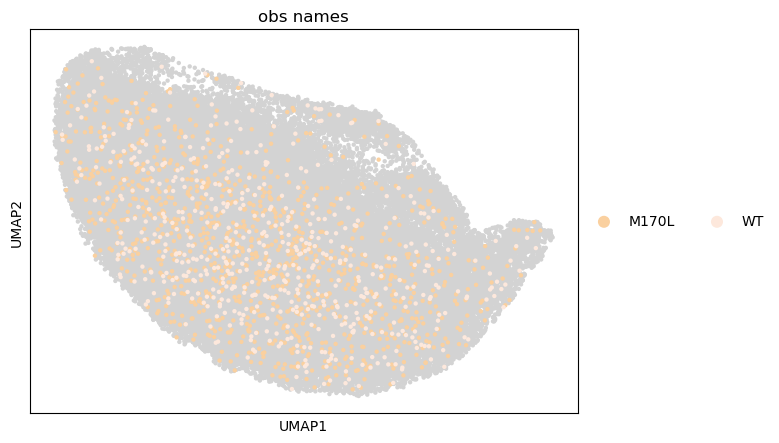

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


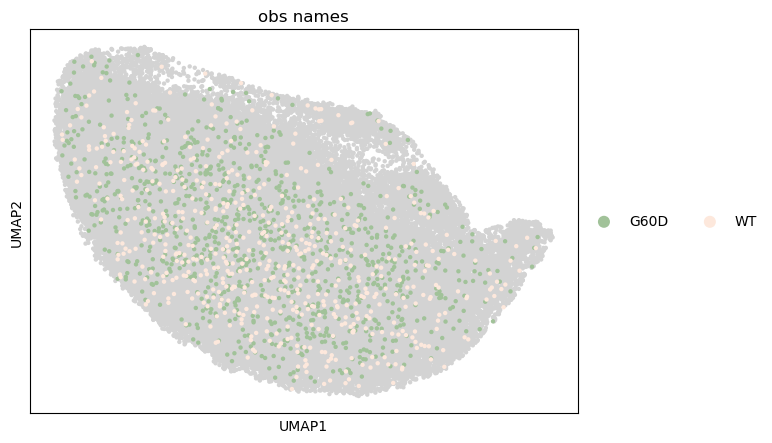

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


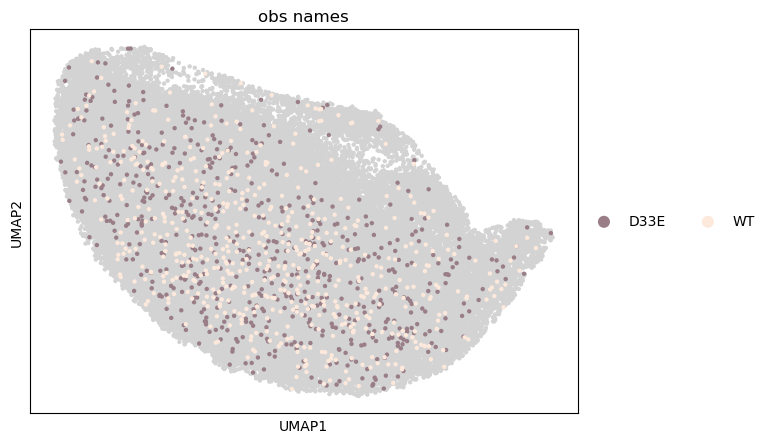

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


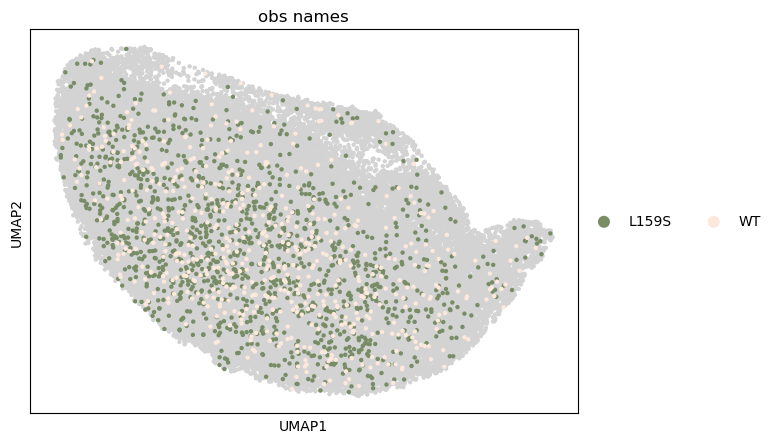

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


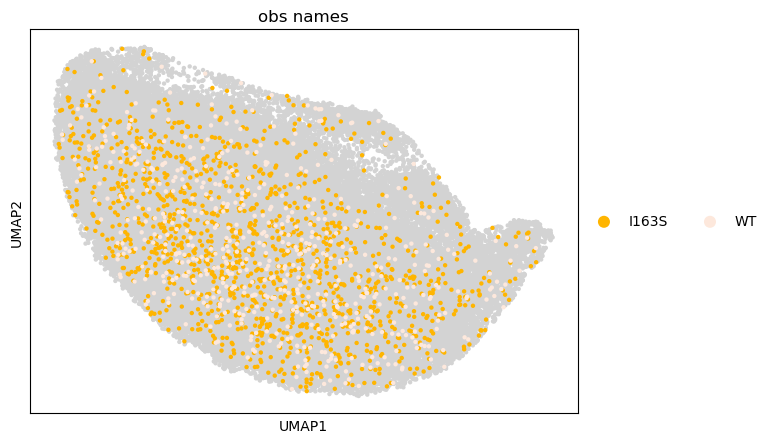

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


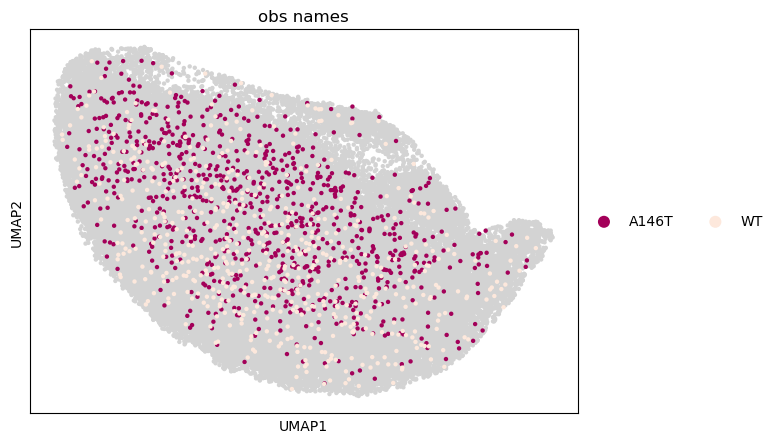

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


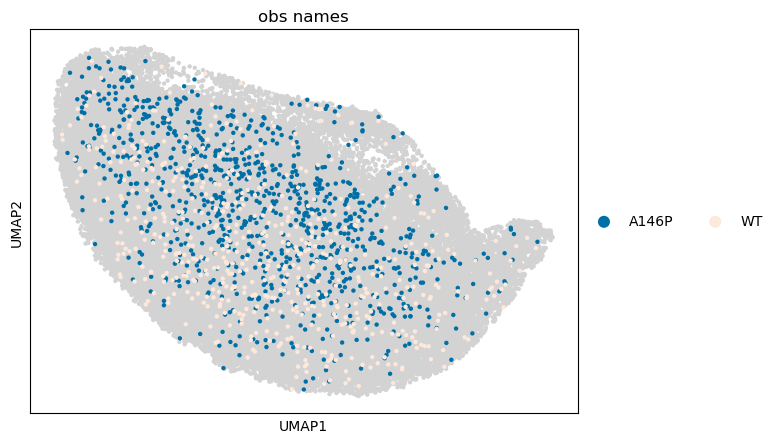

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


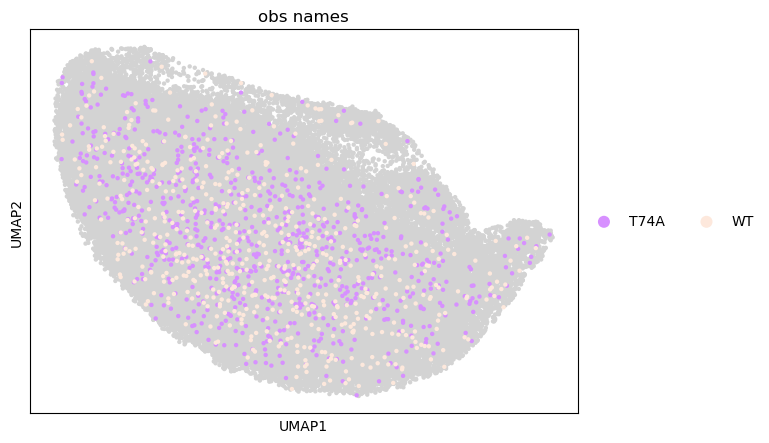

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


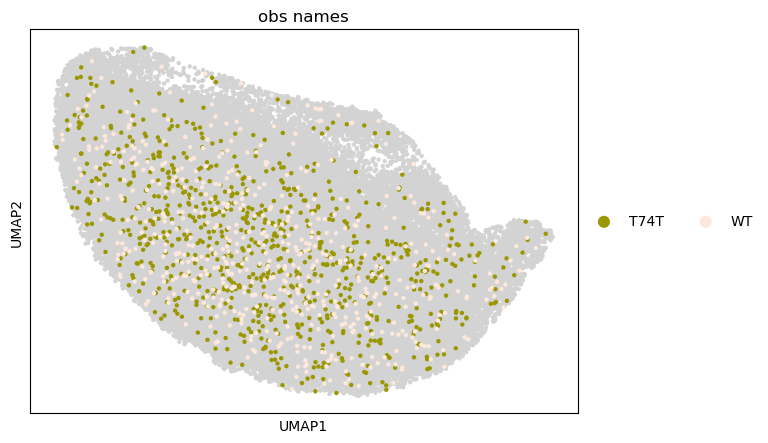

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


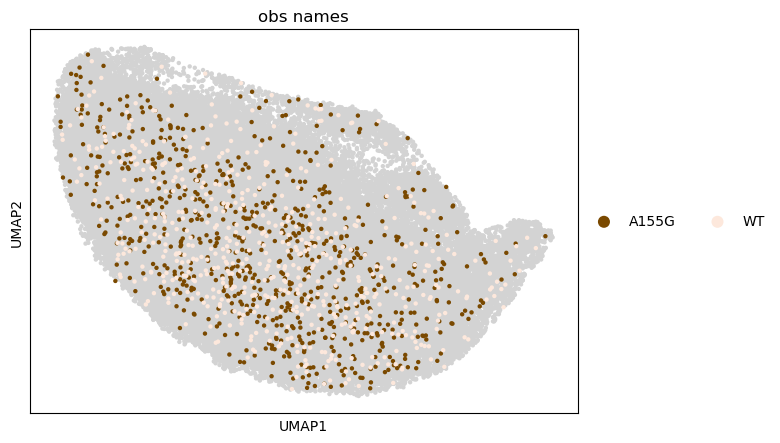

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


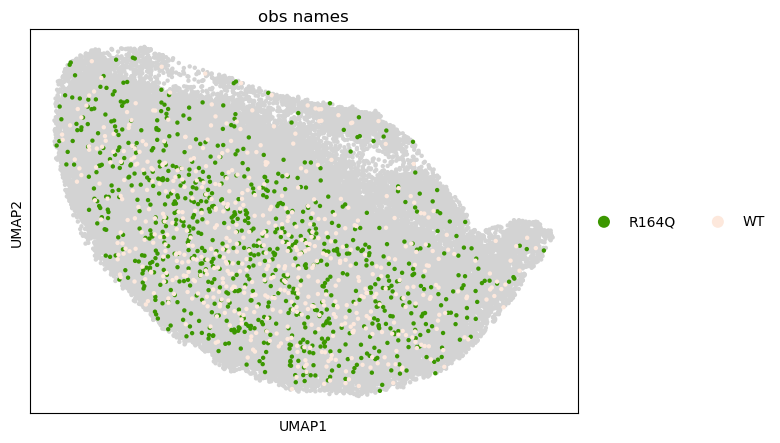

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


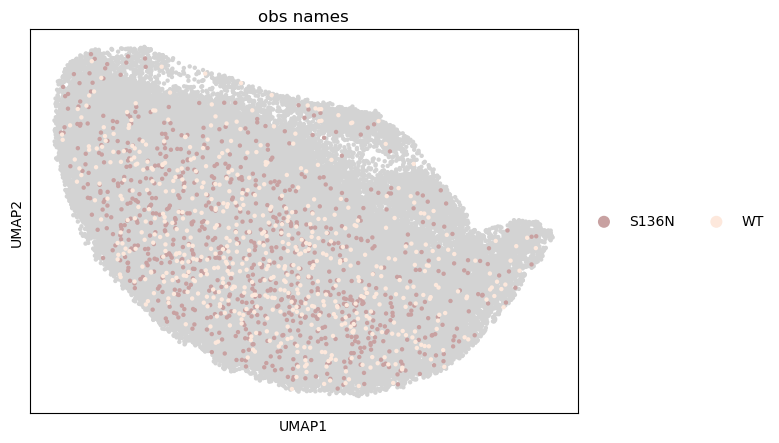

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


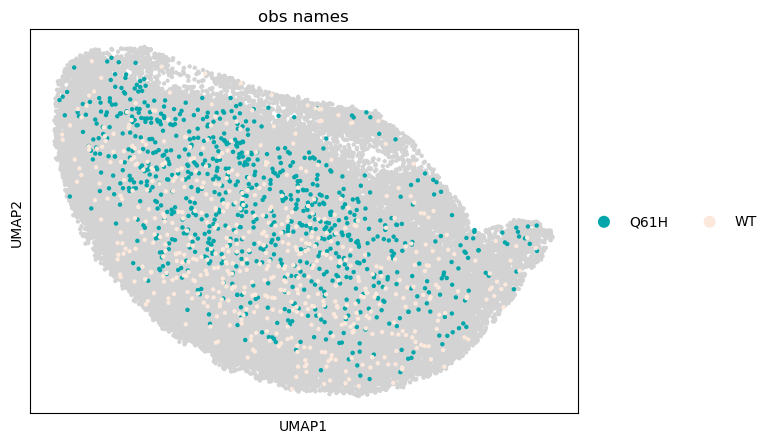

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


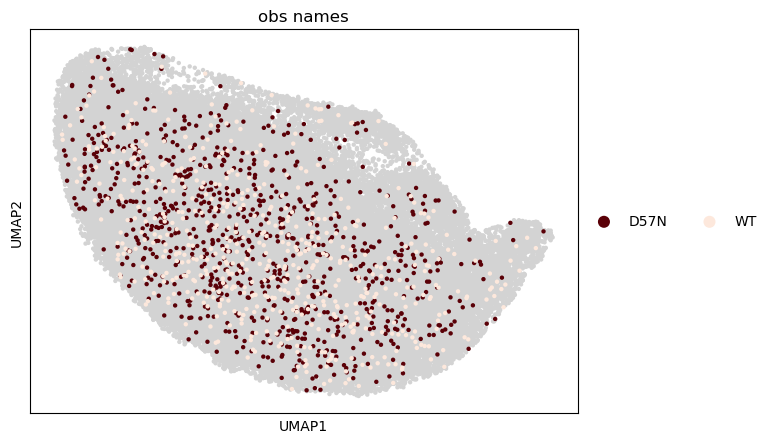

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


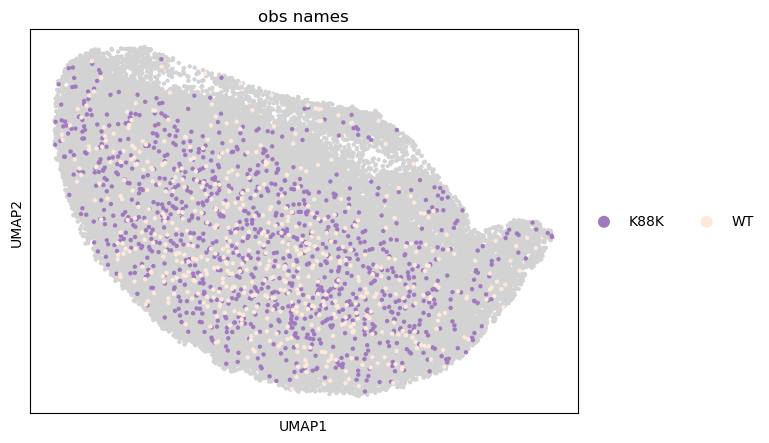

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


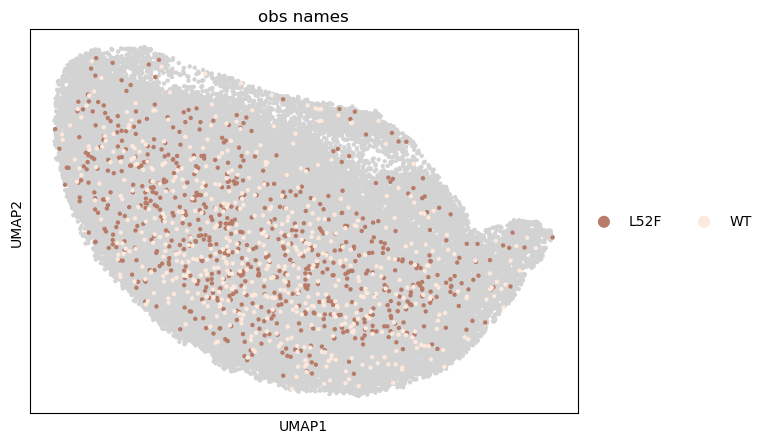

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


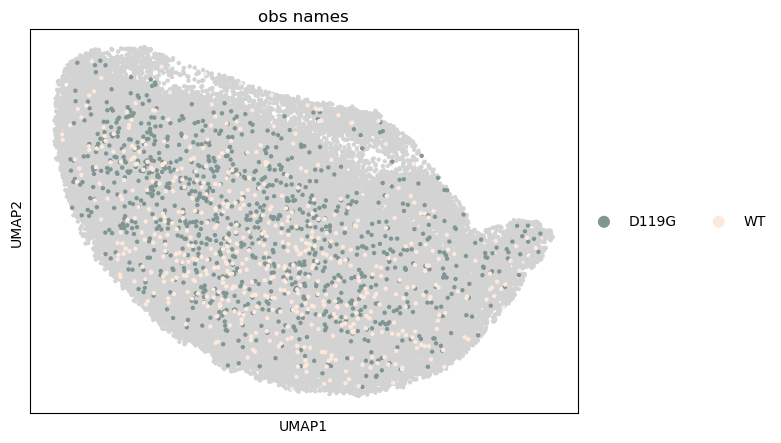

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


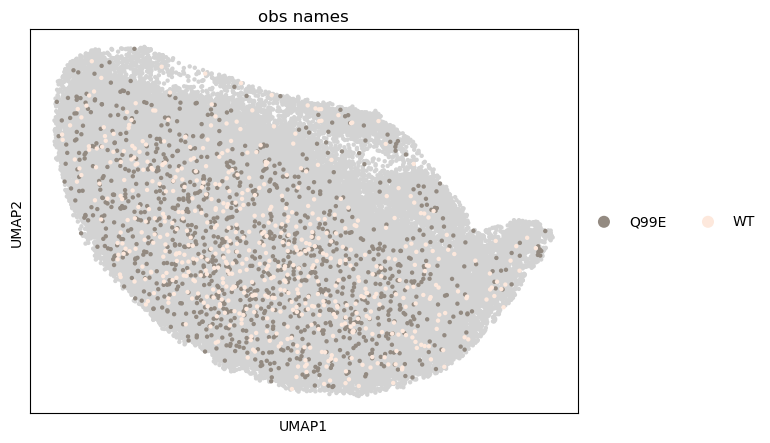

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


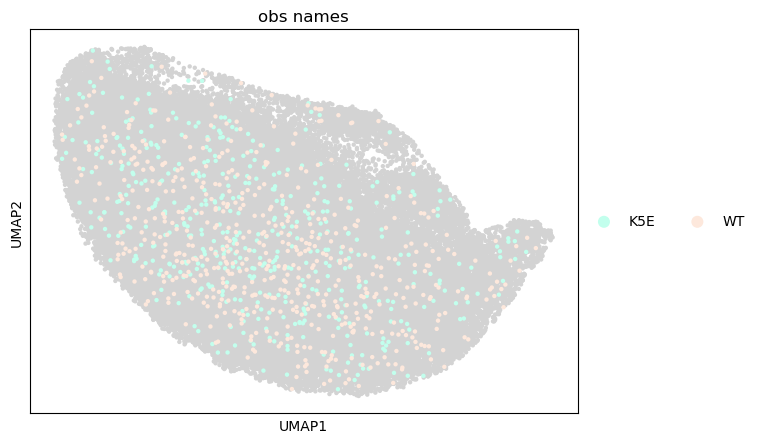

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


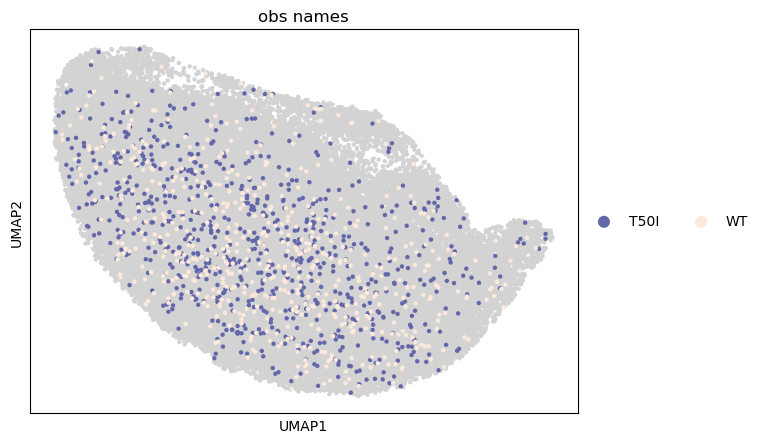

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


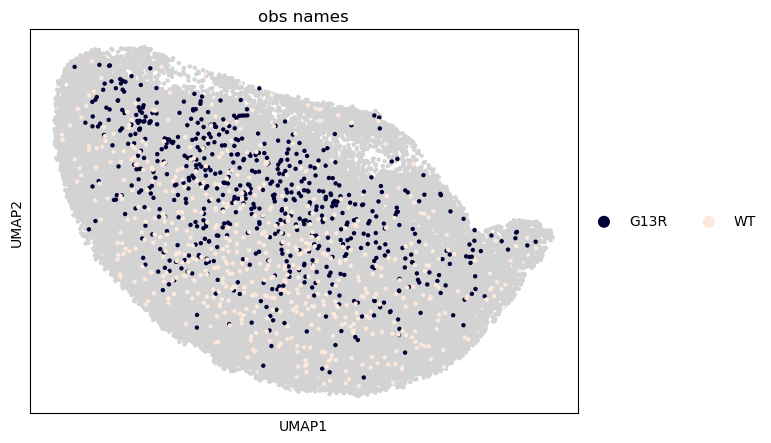

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


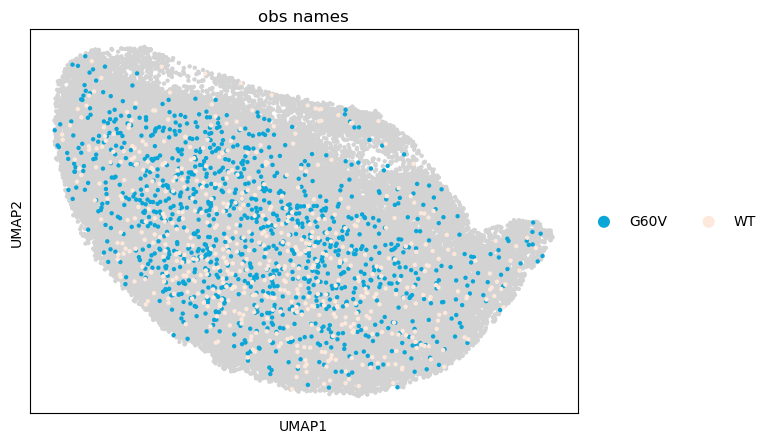

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


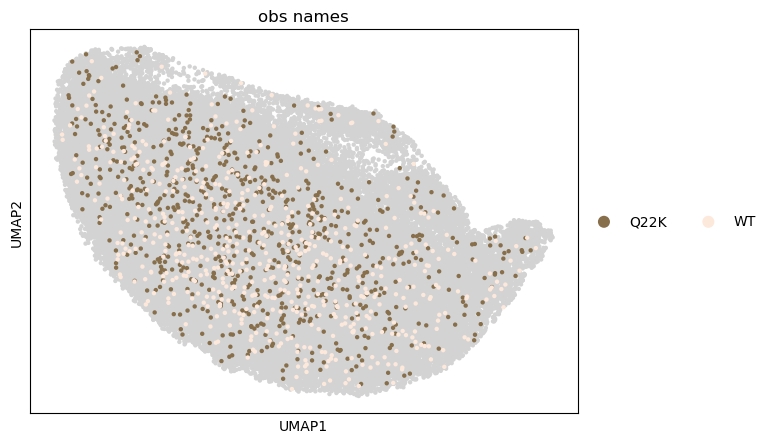

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


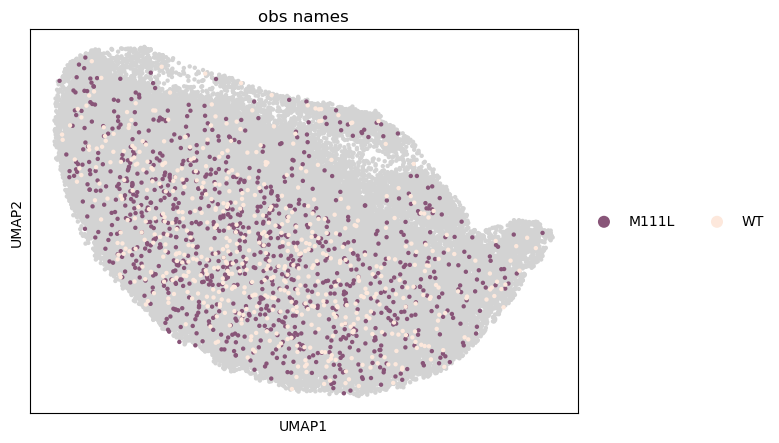

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


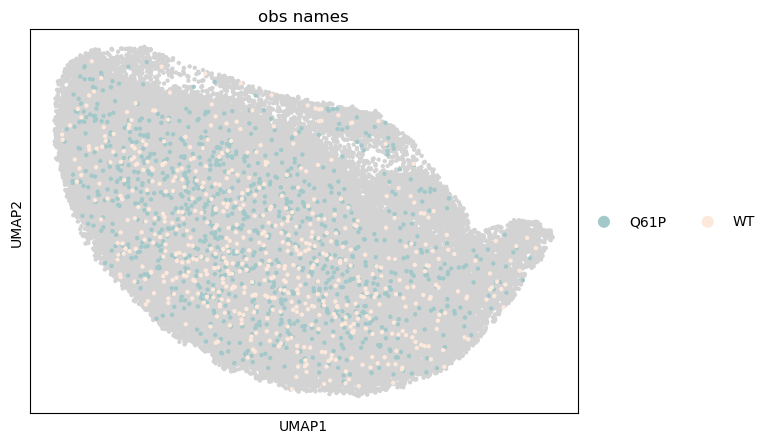

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


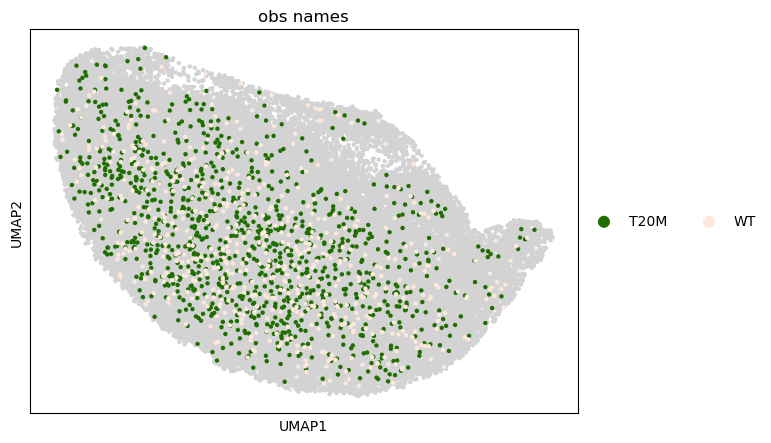

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


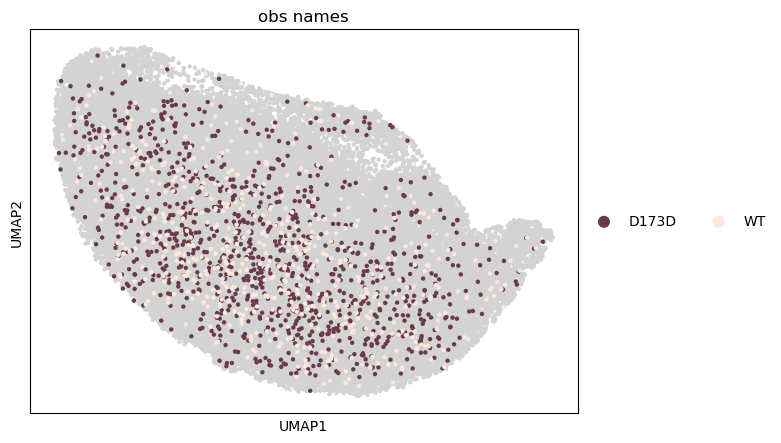

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


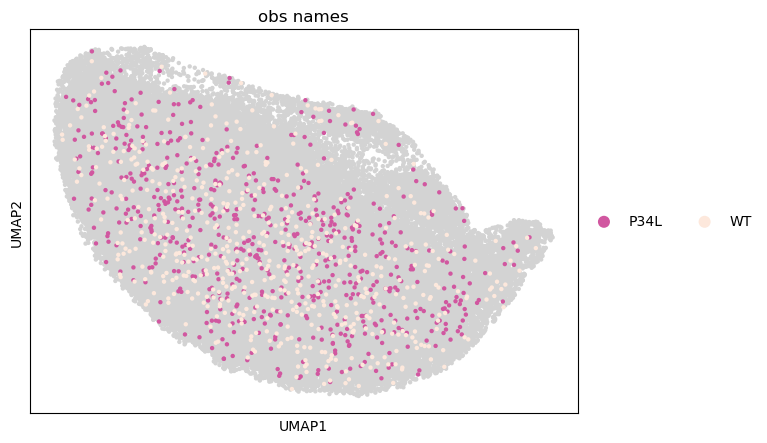

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


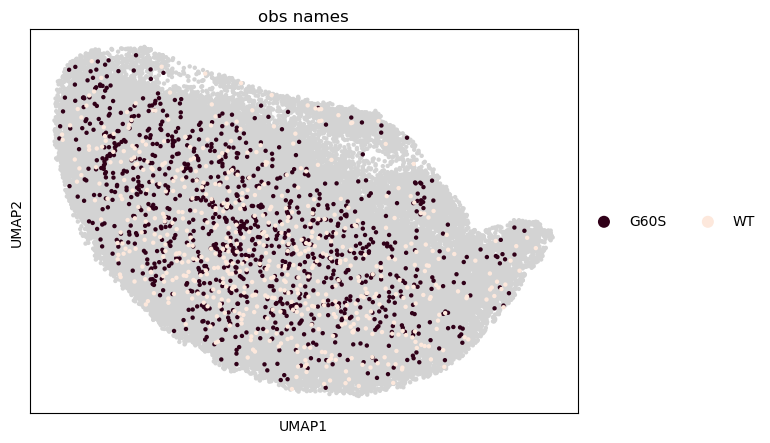

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


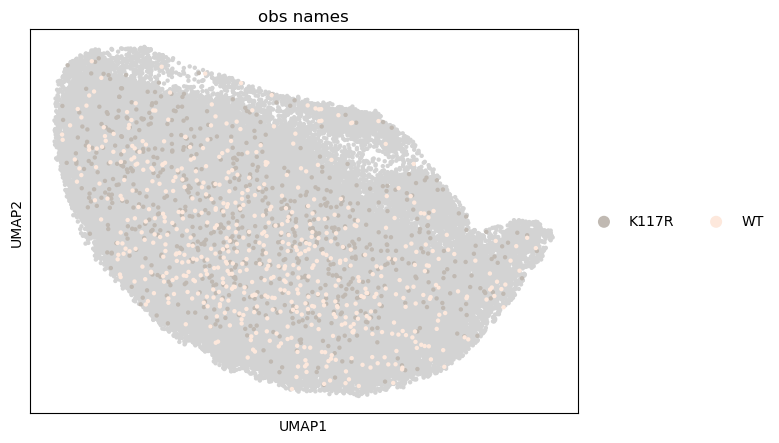

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


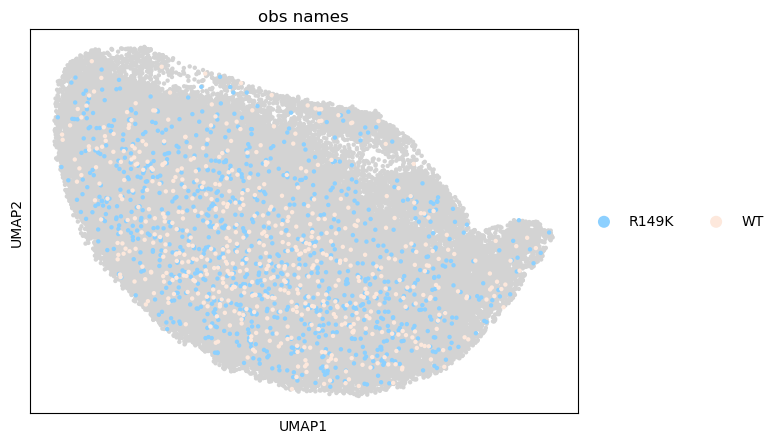

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


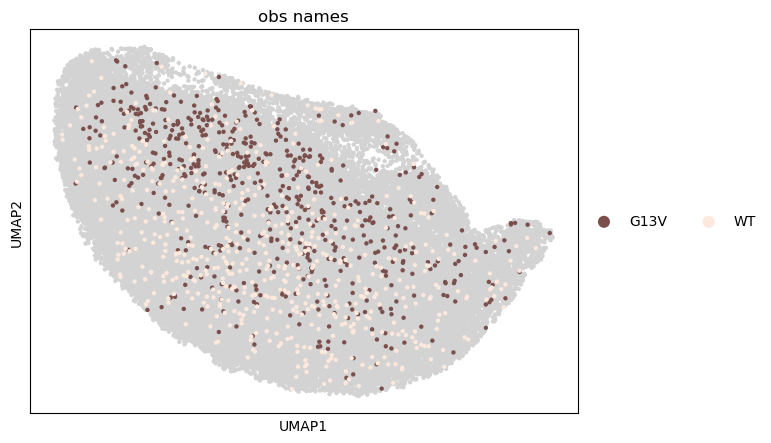

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


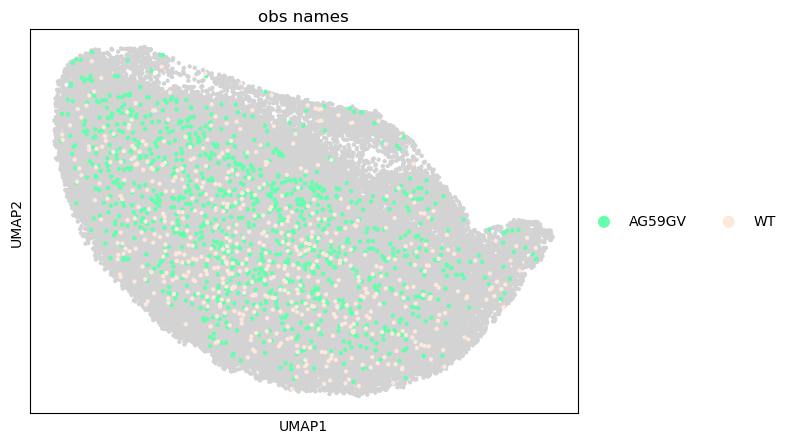

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


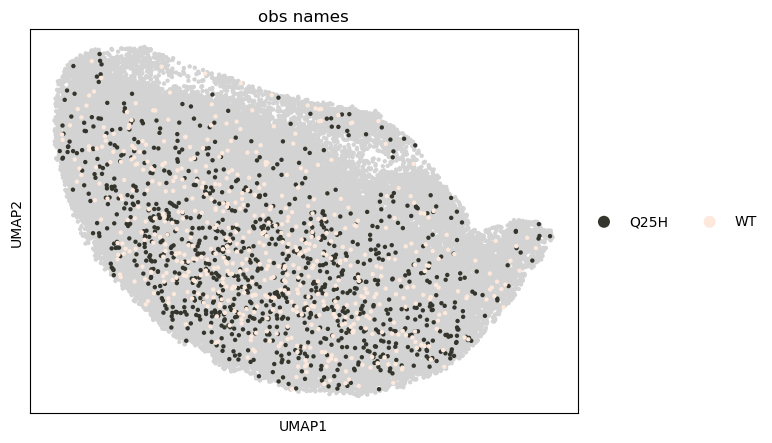

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


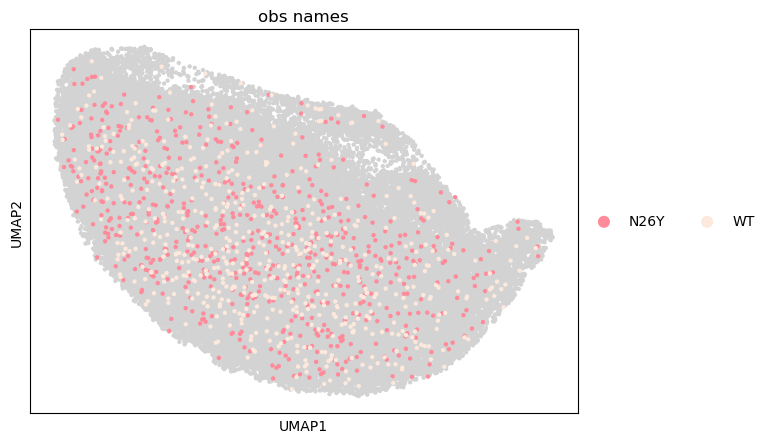

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


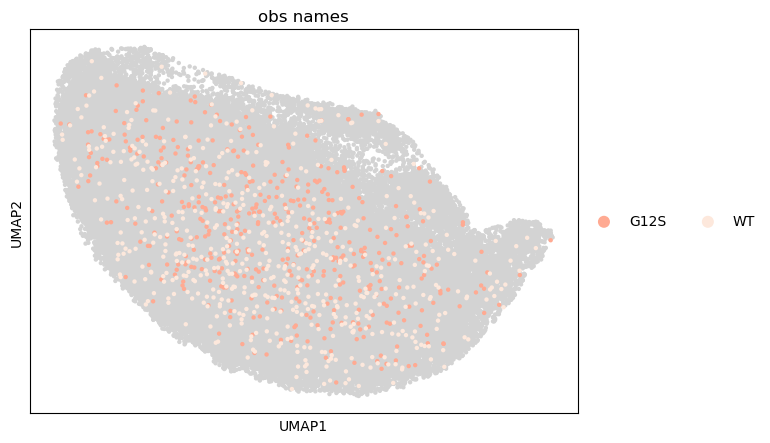

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


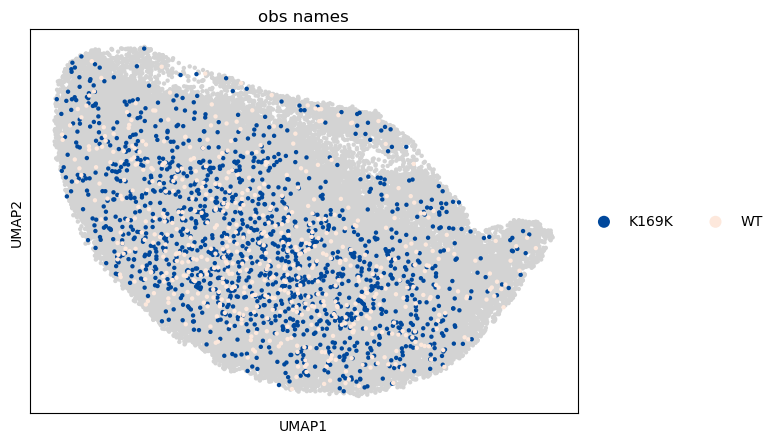

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


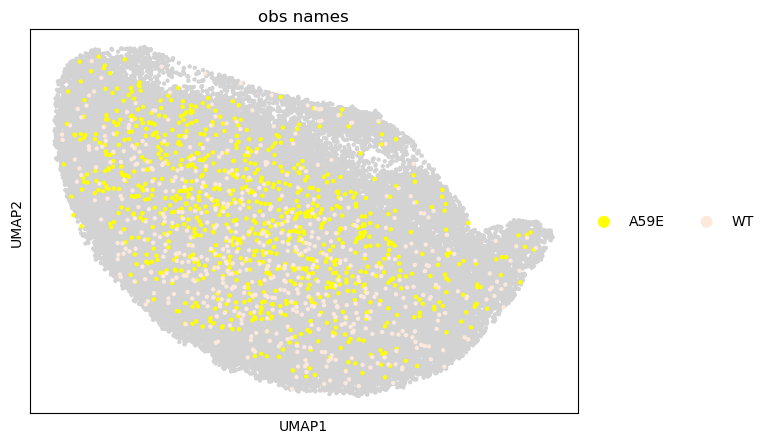

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


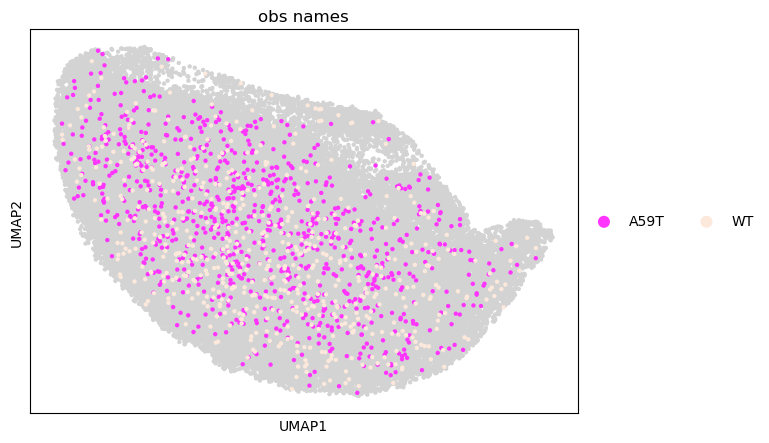

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


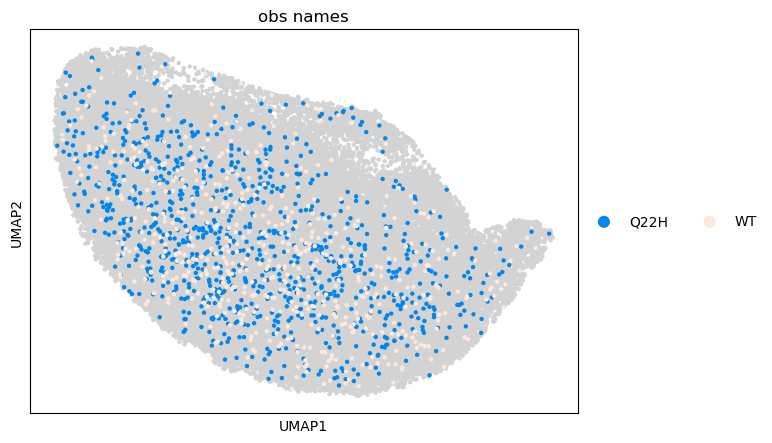

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


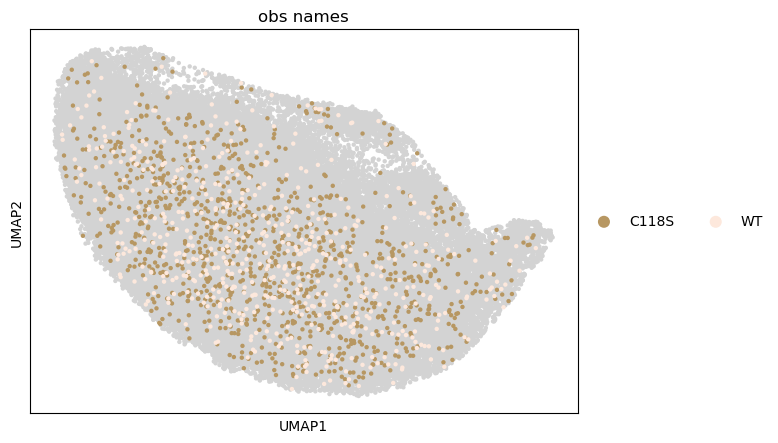

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


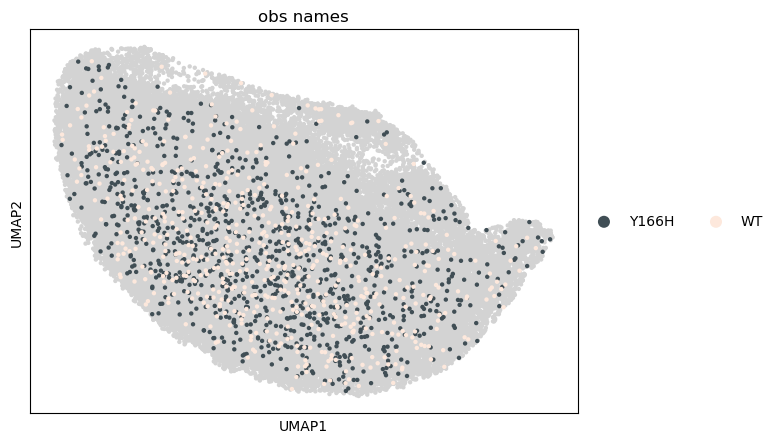

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


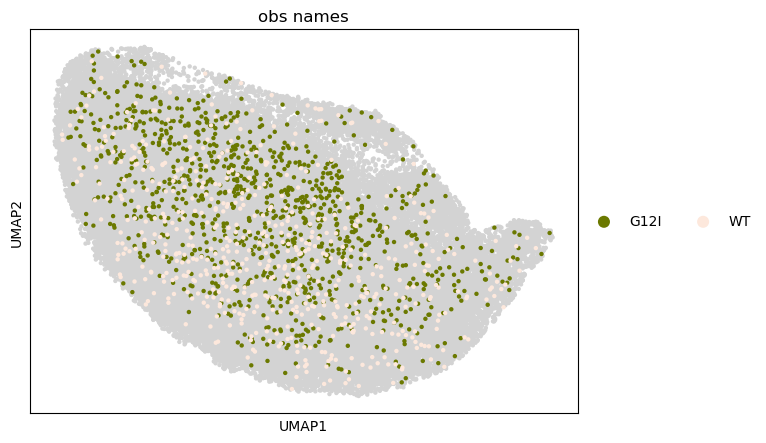

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


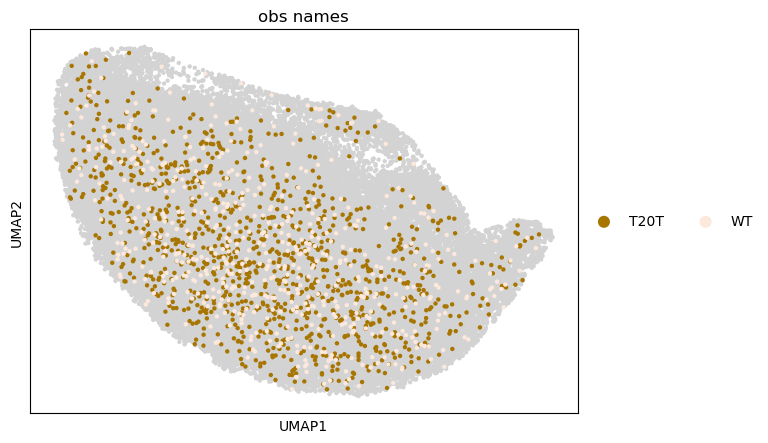

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


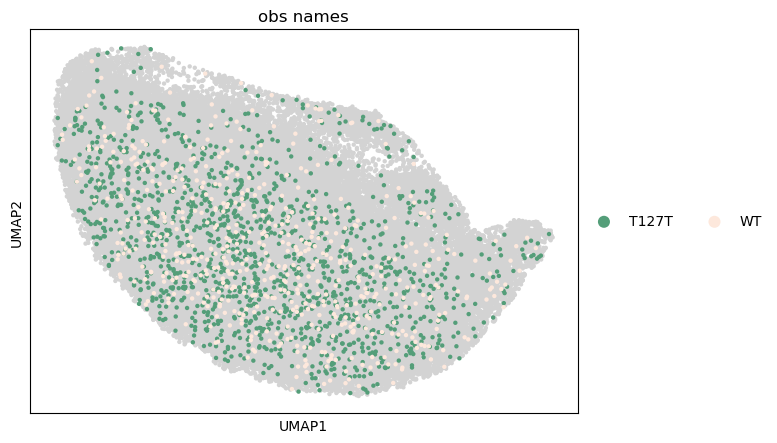

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


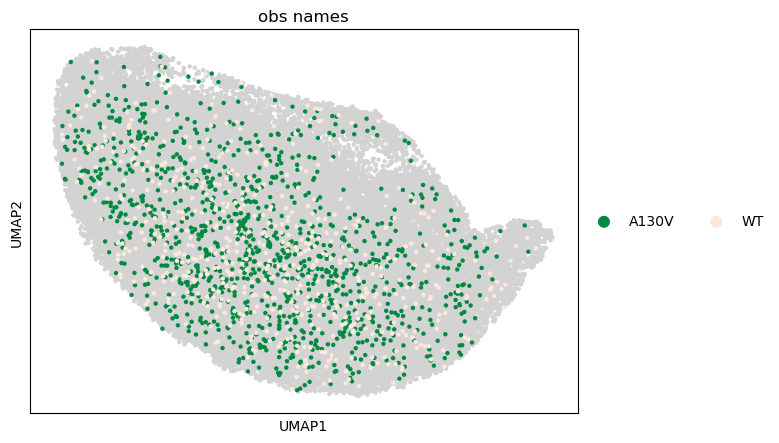

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


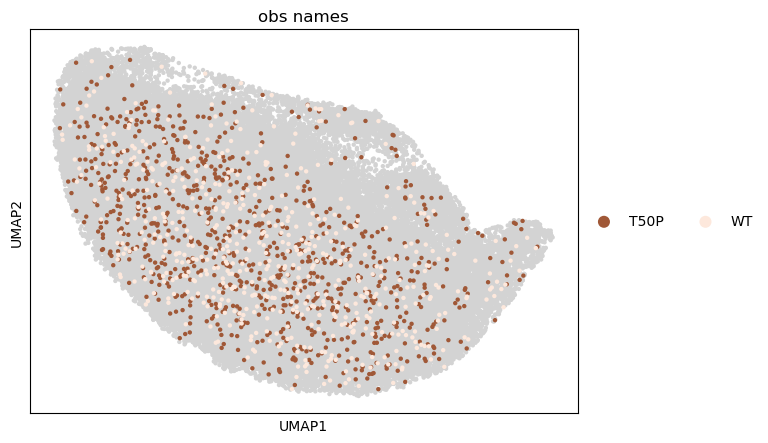

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


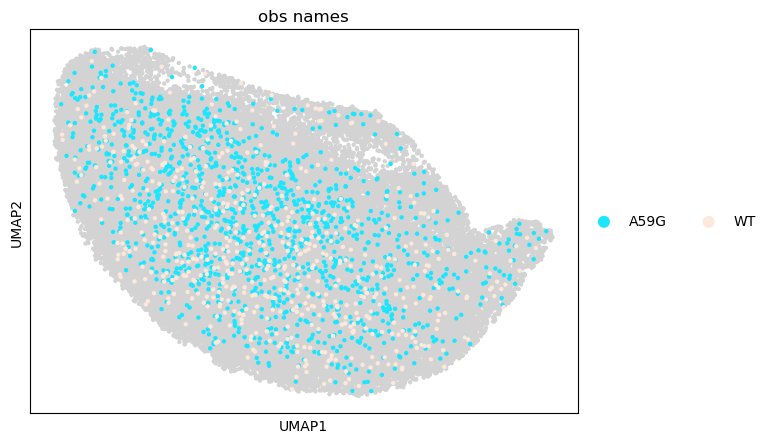

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


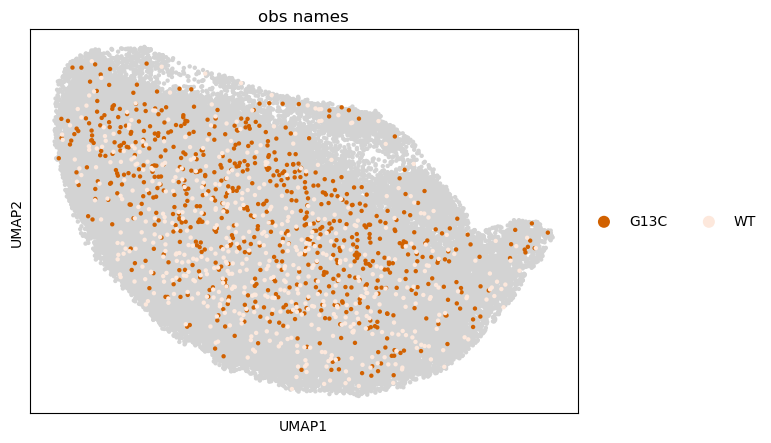

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


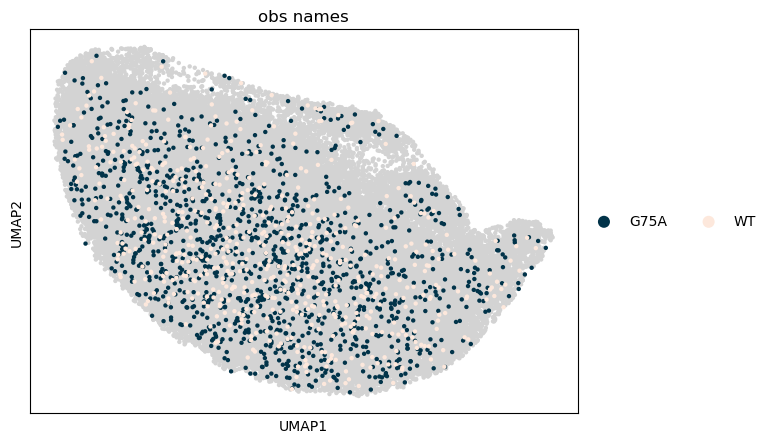

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


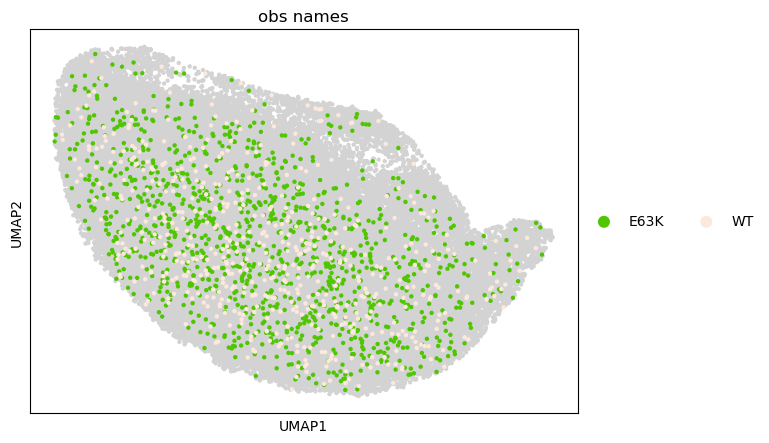

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


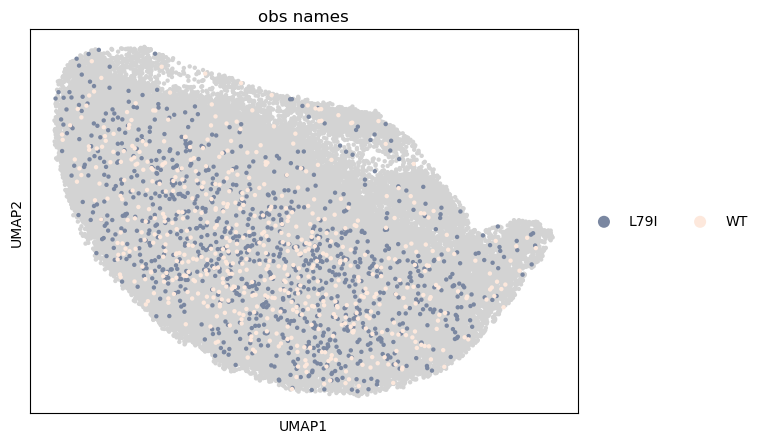

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


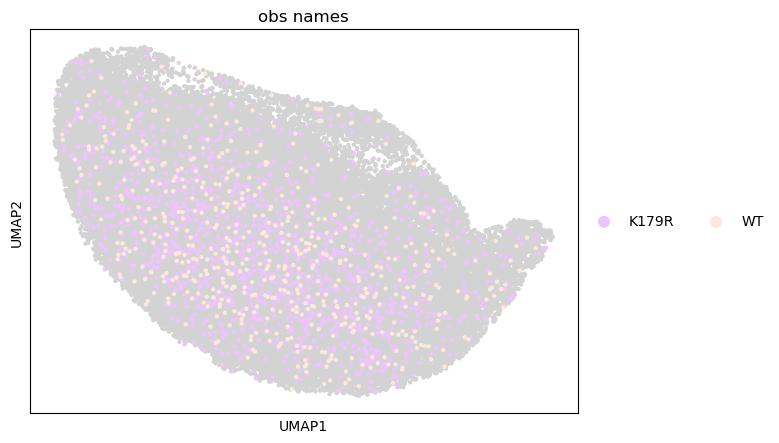

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


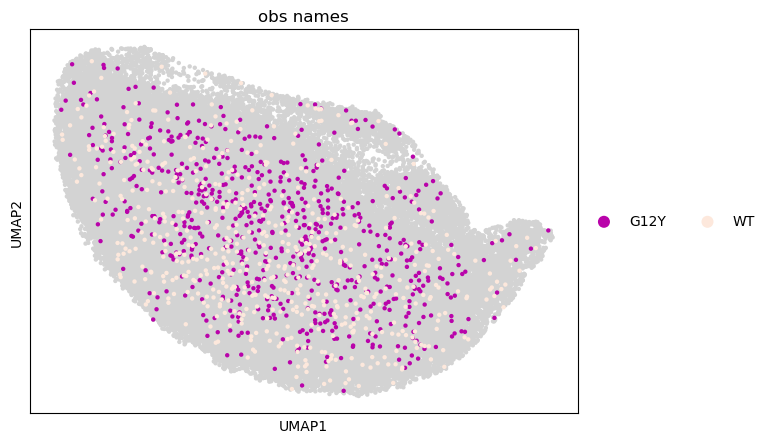

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


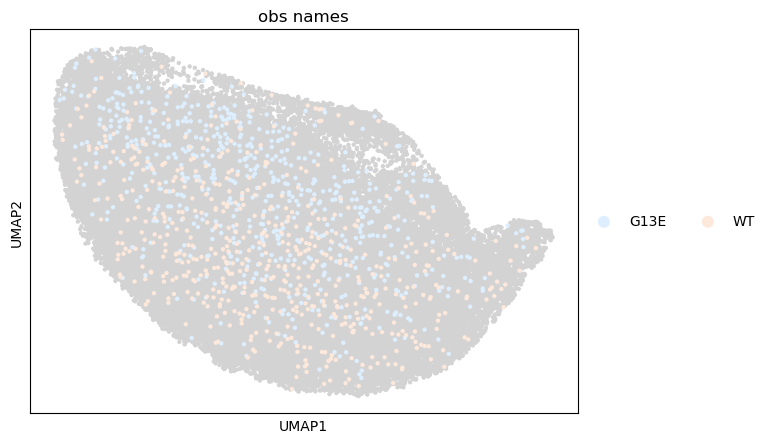

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


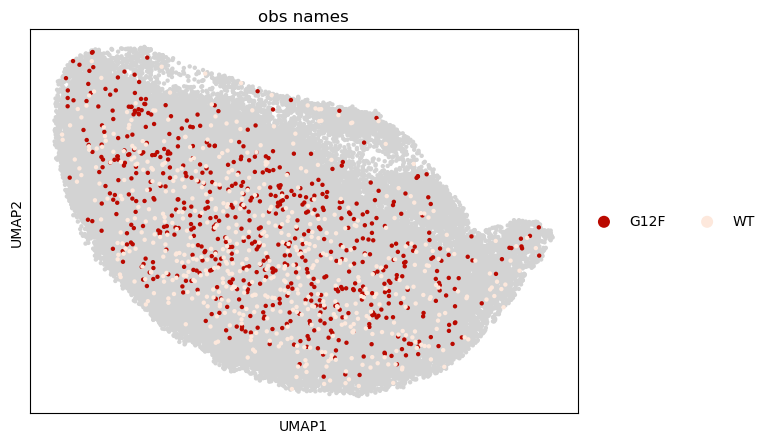

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


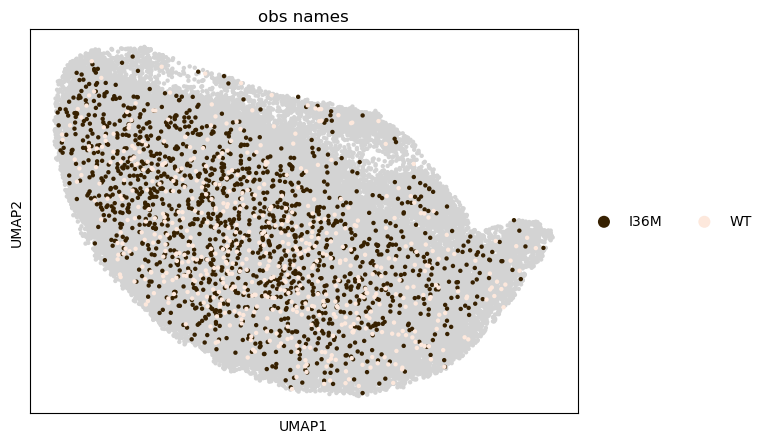

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


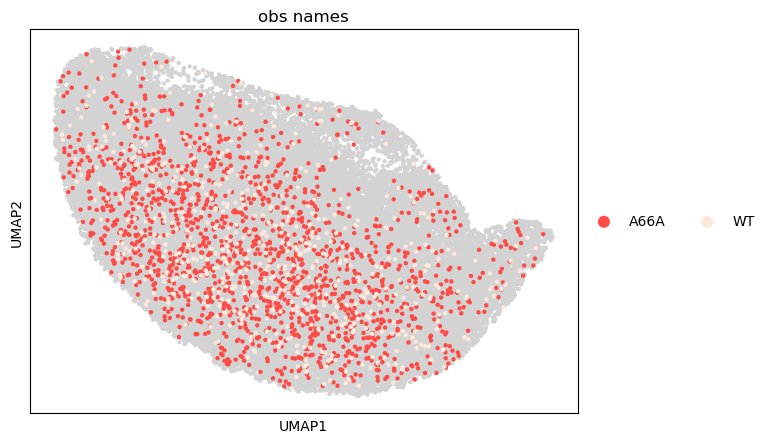

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


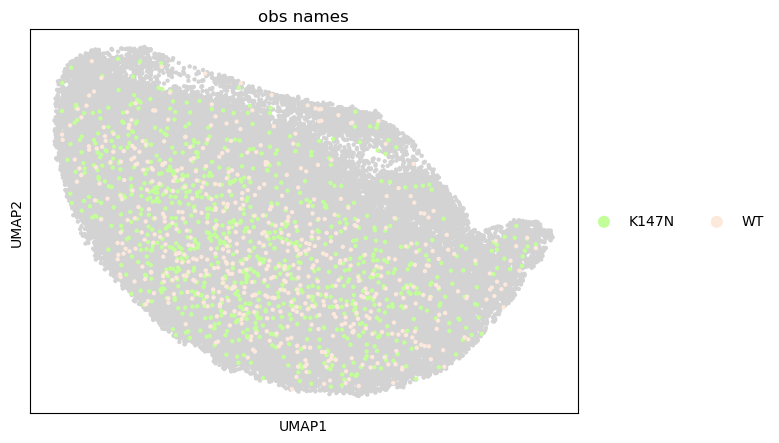

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


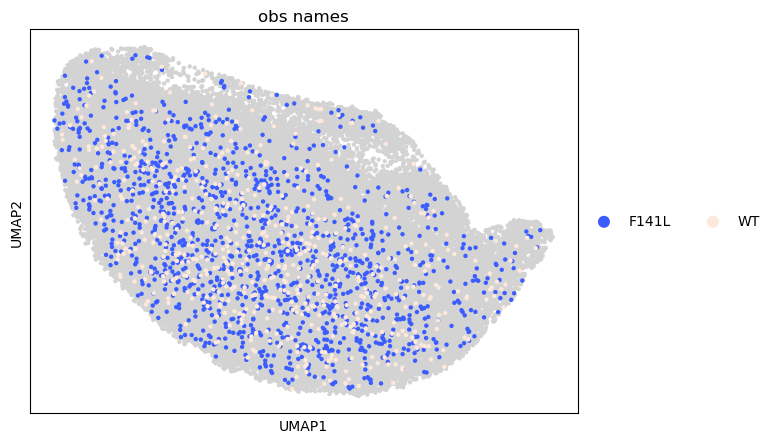

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


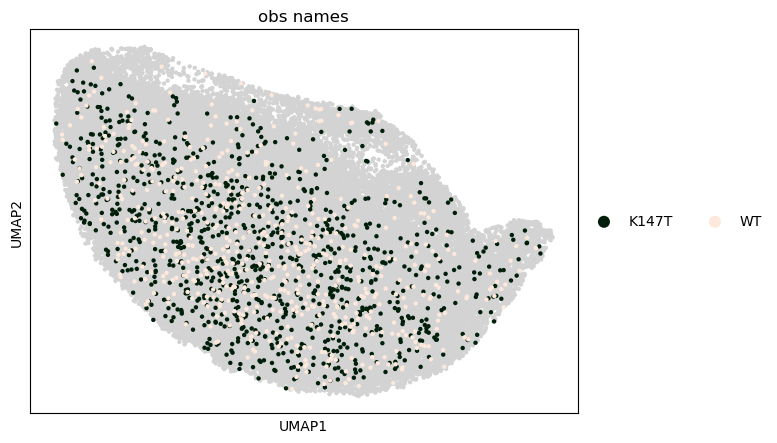

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


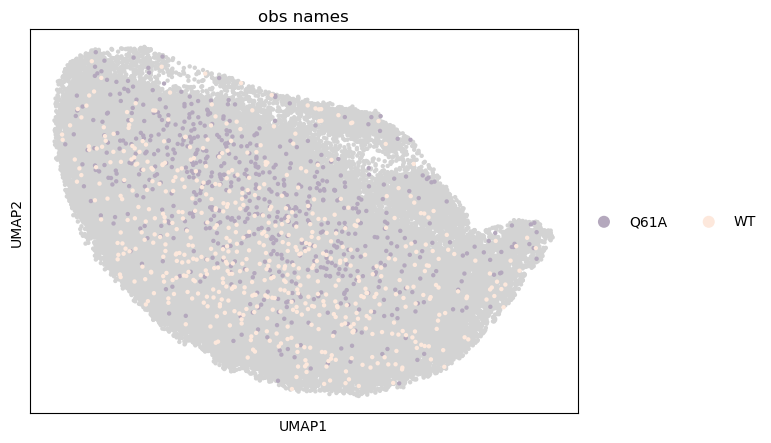

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


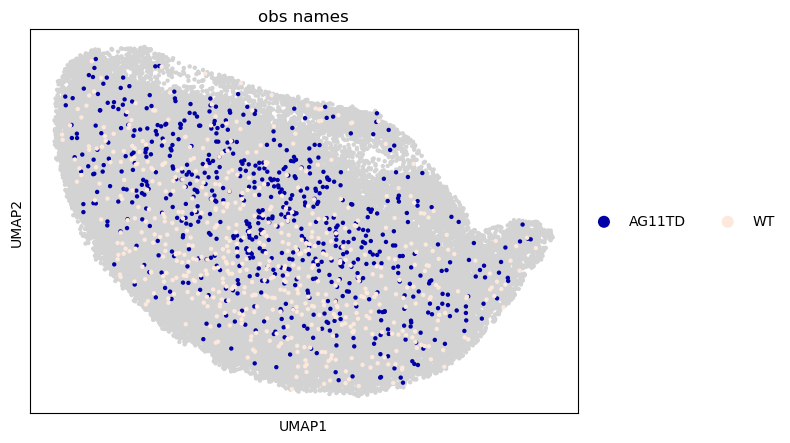

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


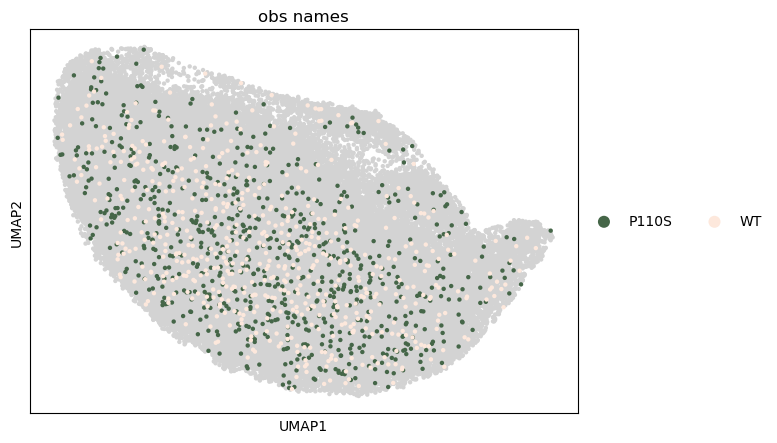

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


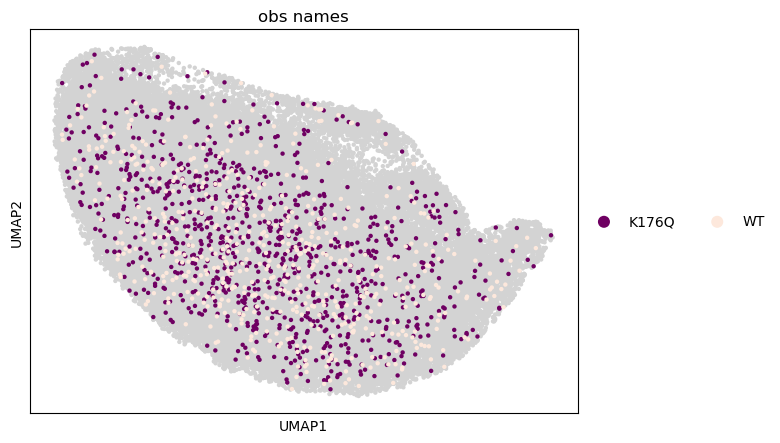

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


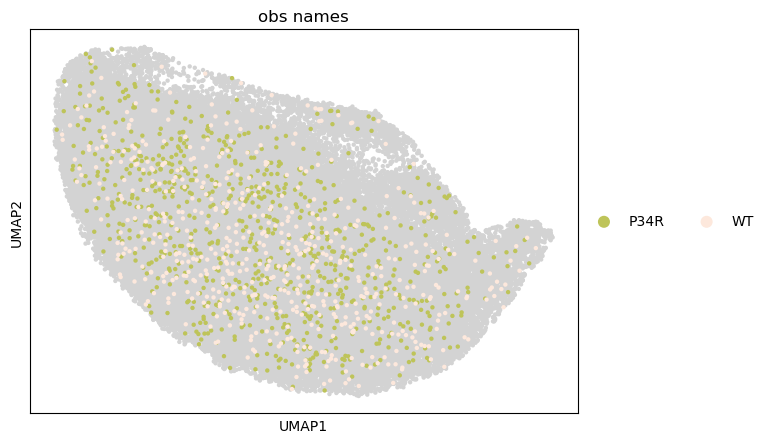

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


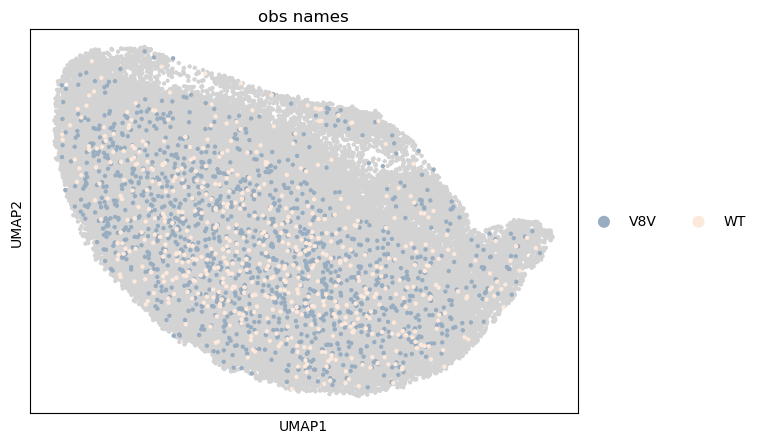

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


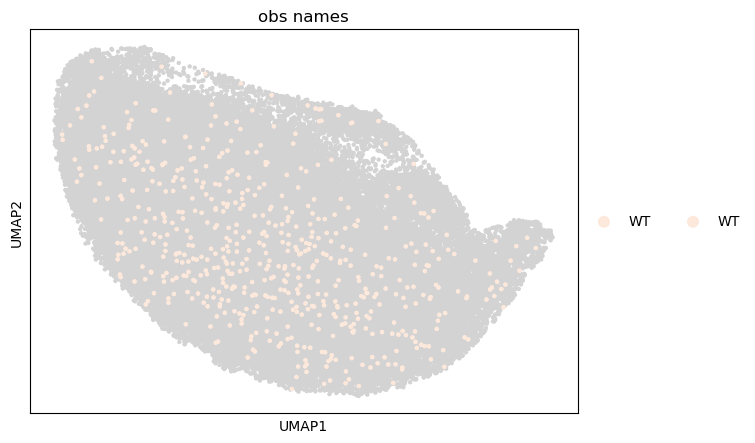

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


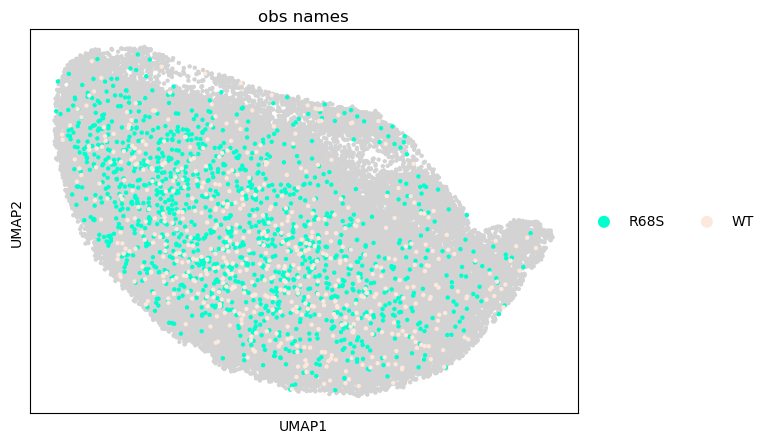

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


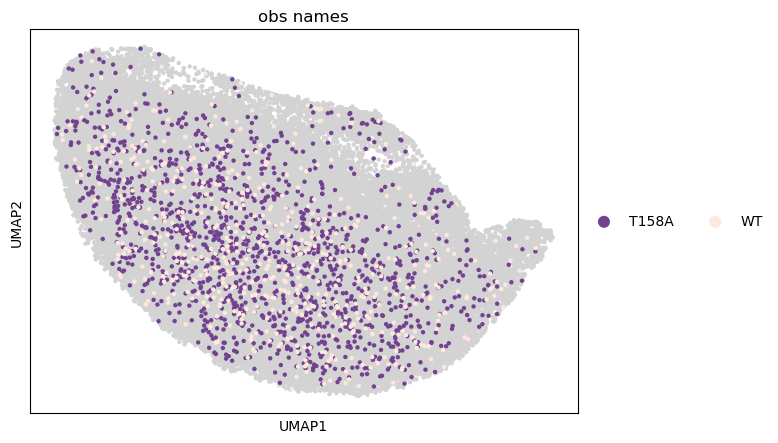

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


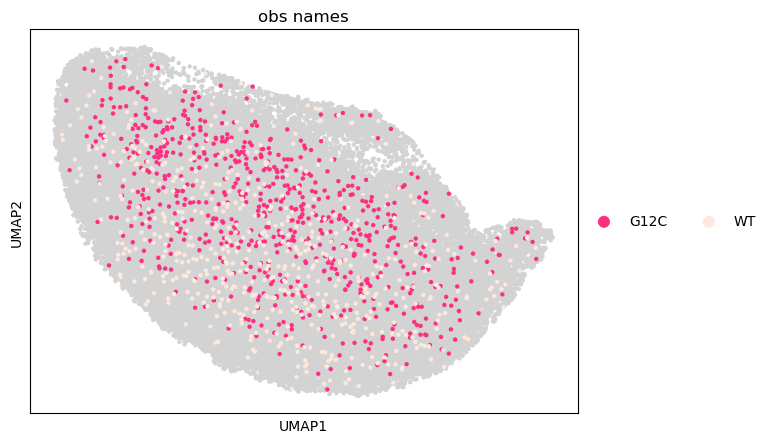

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


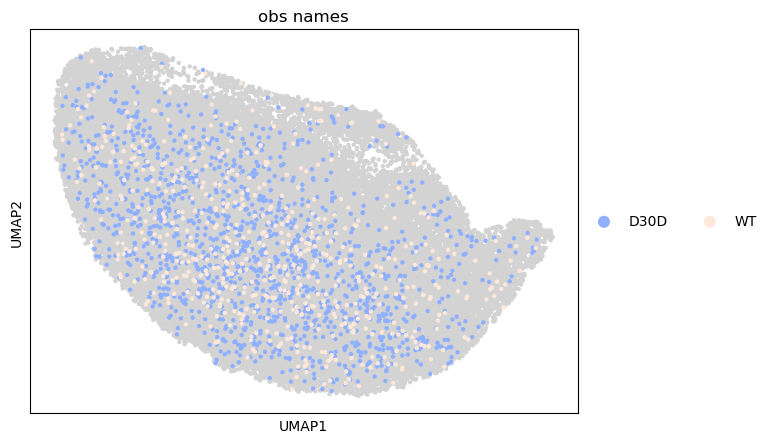

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


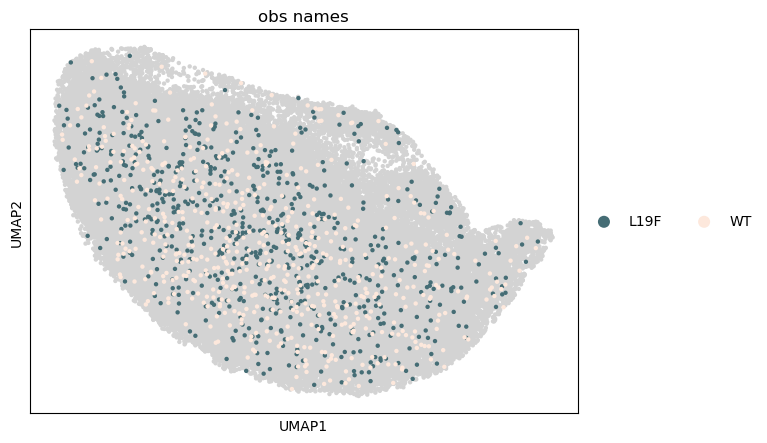

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


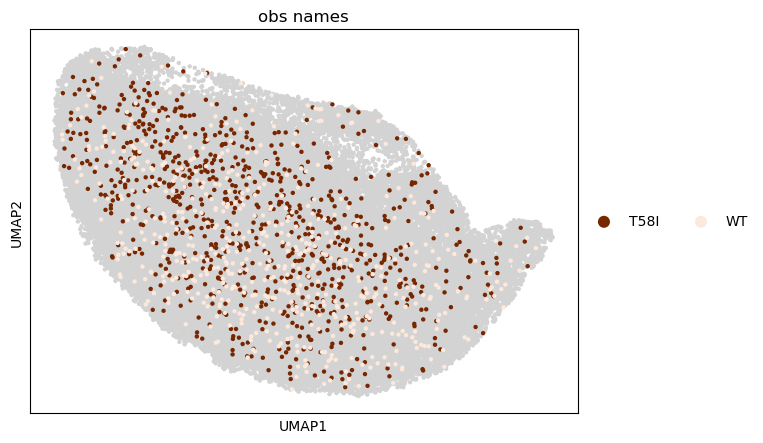

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


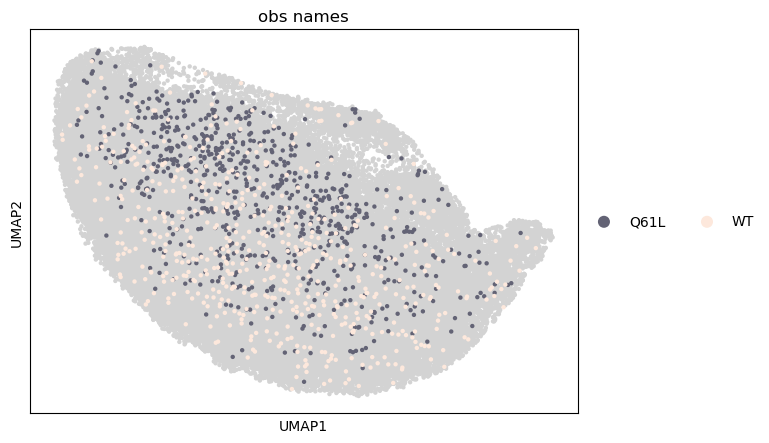

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


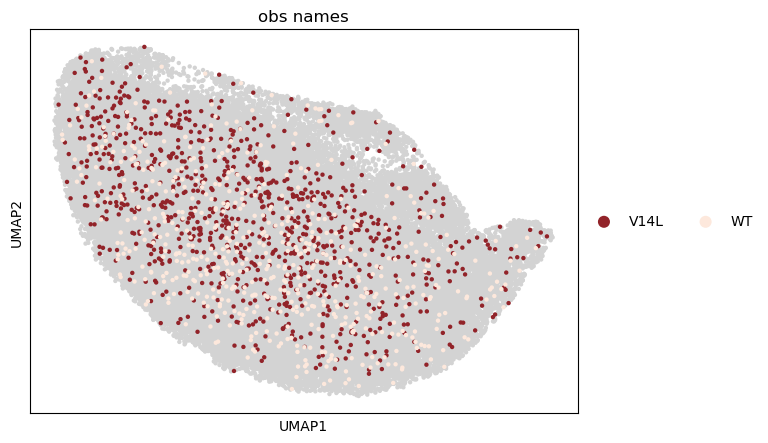

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


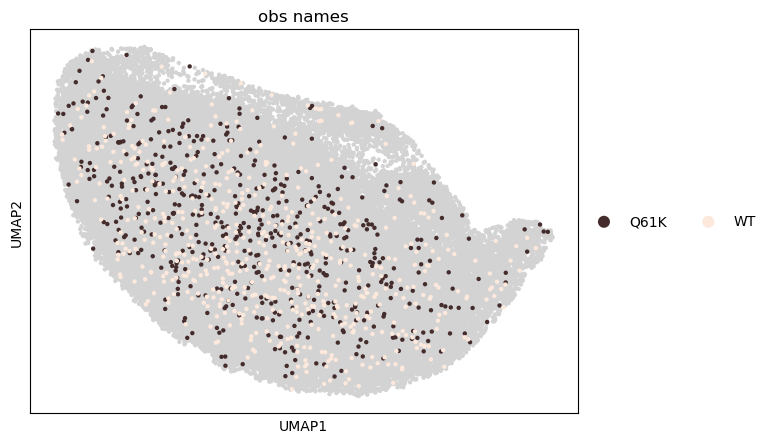

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


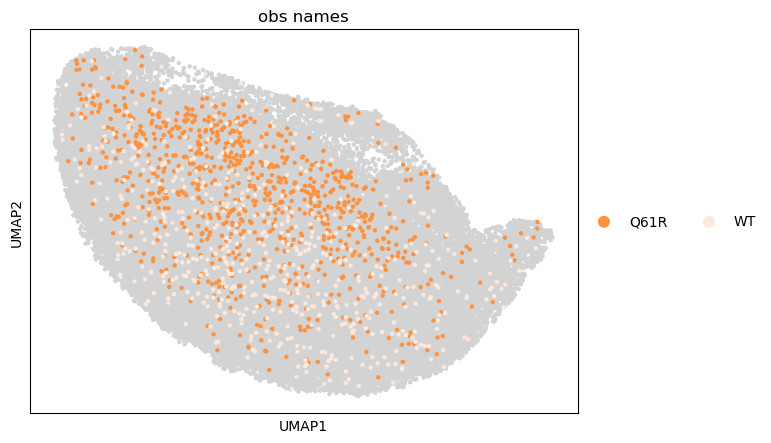

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


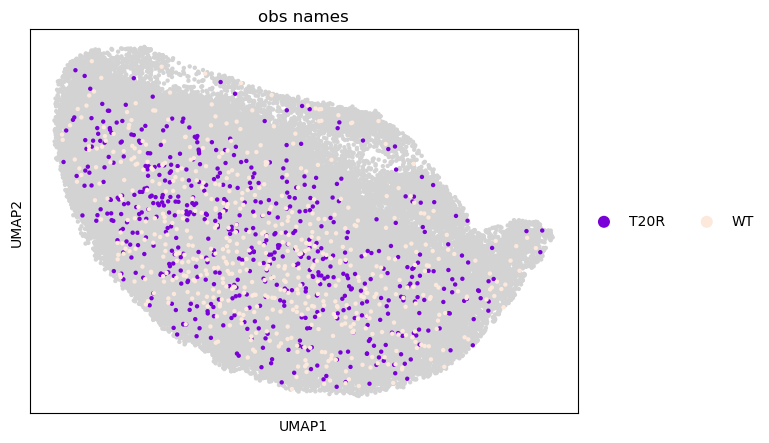

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


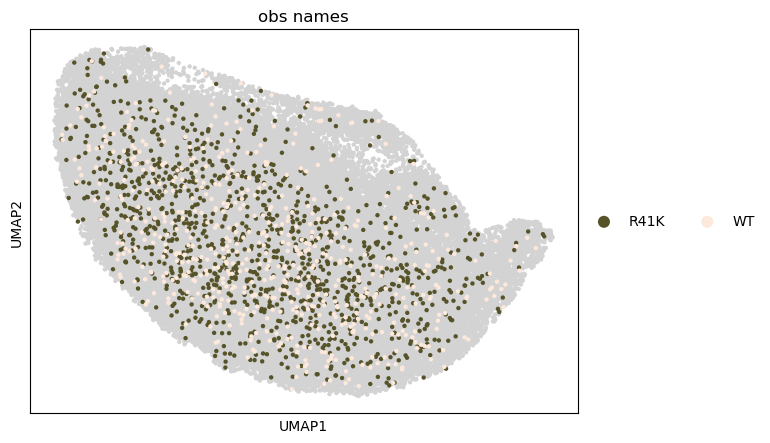

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


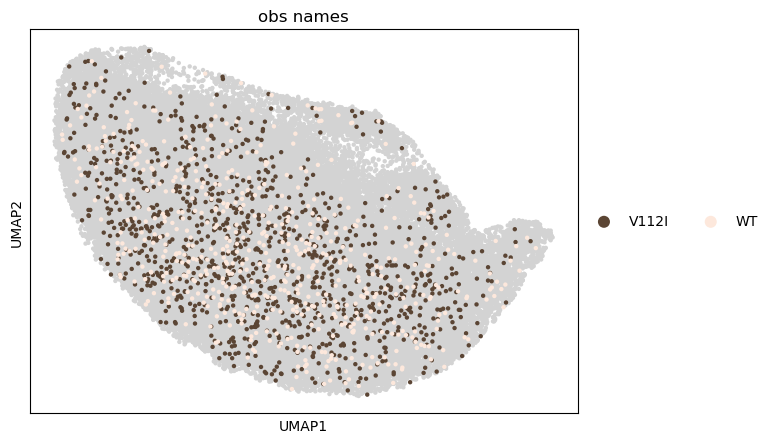

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


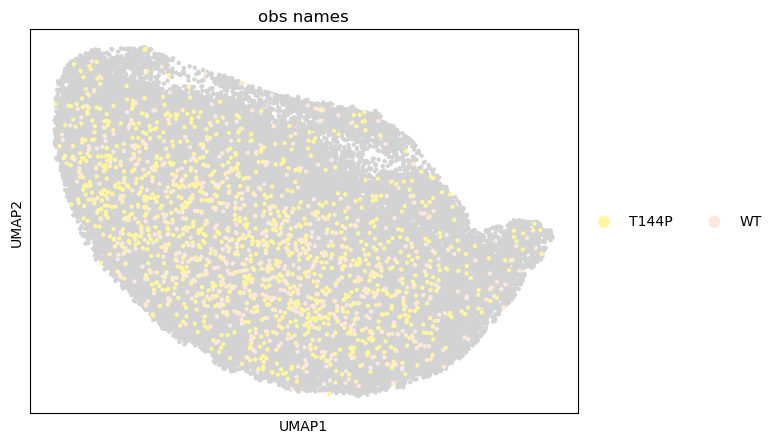

Execution time: 103.835 seconds


In [14]:
# Plot UMAP by variants
pseq.var_umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


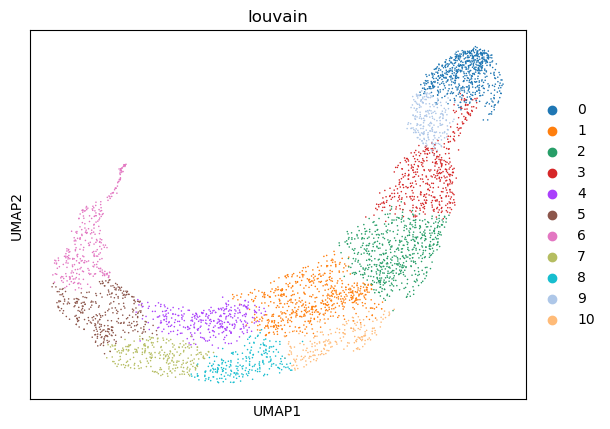

louvain
0     12117
1     10380
2     10376
3      9698
4      9210
5      8913
6      8854
7      6885
8      4974
9      4472
10     3329
11     1862
12     1712
Name: count, dtype: int64

Execution time: 41.631 seconds


In [15]:
# Louvain clustering of genes expressions
adata = pseq.louvain_genes(adata)

In [16]:
##### CHECKPOINT: Recover outpout from previous function in order to avoid running it again #####
"""
import pickle as pkl
with open('./results/louvain_data.pkl', 'rb') as file:
    adata = pkl.load(file)
"""

"\nimport pickle as pkl\nwith open('./results/louvain_data.pkl', 'rb') as file:\n    adata = pkl.load(file)\n"

In [17]:
# Saving the genes names (HGNC nomenclature)
with open('var_names.txt', 'w') as file:
    for gene in adata.var['var_names']:
        file.write(gene + '\n')

In [14]:
##### HGNC nomenclature ---> BioMart mapping ---> Ensembl genes ID nomenclature #####

In [18]:
# Fetching the Ensembl genes IDs and checking lost genes during mapping
var_names = pd.read_csv('mart_export.txt', sep = '\t')
display(var_names)
var_dict = var_names.set_index('Gene name').T.to_dict('records')[0]  # Duplicated mappings are removed
print('The %.2f%% of genes were lost during mapping' % (100 - len(var_dict) / len(adata.var['var_names']) * 100))

,Gene stable ID,Gene name
0,ENSG00000198888,MT-ND1
1,ENSG00000198712,MT-CO2
2,ENSG00000198840,MT-ND3
3,ENSG00000198886,MT-ND4
4,ENSG00000198695,MT-ND6
...,...,...
4032,ENSG00000211452,DIO1
4033,ENSG00000116209,TMEM59
4034,ENSG00000060688,SNRNP40
4035,ENSG00000168528,SERINC2


The 14.10% of genes were lost during mapping


/tmp/ipykernel_18480/3874717756.py:4: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  var_dict = var_names.set_index('Gene name').T.to_dict('records')[0]  # Duplicated mappings are removed


In [19]:
# Genes not mapped will be linked to the ID 'Null'
mart = []
for var in adata.var['var_names']:
    if var in var_dict.keys(): mart.append(var_dict[var])
    else:                      mart.append('Null')

In [20]:
# Pathway enrichment analysis with gprofiler library
gprofiler_df = pseq.path_gprofiler(adata, mart)

,louvain,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents,intersections,evidences
0,0,KEGG,KEGG:04060,Cytokine-cytokine receptor interaction,0.003782,True,Cytokine-cytokine receptor interaction,291,178,18,8484,0.101124,0.061856,query_1,[KEGG:00000],"[ENSG00000186891, ENSG00000157873, ENSG0000002...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
1,0,KEGG,KEGG:04061,Viral protein interaction with cytokine and cy...,0.020822,True,Viral protein interaction with cytokine and cy...,98,178,9,8484,0.050562,0.091837,query_1,[KEGG:00000],"[ENSG00000157873, ENSG00000028137, ENSG0000018...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
0,1,KEGG,KEGG:04933,AGE-RAGE signaling pathway in diabetic complic...,0.000088,True,AGE-RAGE signaling pathway in diabetic complic...,100,242,14,8484,0.057851,0.140000,query_1,[KEGG:00000],"[ENSG00000177606, ENSG00000092969, ENSG0000011...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
1,1,KEGG,KEGG:04668,TNF signaling pathway,0.001990,True,TNF signaling pathway,113,242,13,8484,0.053719,0.115044,query_1,[KEGG:00000],"[ENSG00000177606, ENSG00000184371, ENSG0000011...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
2,1,KEGG,KEGG:04350,TGF-beta signaling pathway,0.024431,True,TGF-beta signaling pathway,107,242,11,8484,0.045455,0.102804,query_1,[KEGG:00000],"[ENSG00000092969, ENSG00000049323, ENSG0000016...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,7,KEGG,KEGG:05169,Epstein-Barr virus infection,0.045876,True,Epstein-Barr virus infection,198,120,10,8484,0.083333,0.050505,query_1,[KEGG:00000],"[ENSG00000163636, ENSG00000145386, ENSG0000019...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
4,7,KEGG,KEGG:00620,Pyruvate metabolism,0.047777,True,Pyruvate metabolism,47,120,5,8484,0.041667,0.106383,query_1,[KEGG:00000],"[ENSG00000168291, ENSG00000197894, ENSG0000006...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG]]"
0,10,KEGG,KEGG:03008,Ribosome biogenesis in eukaryotes,0.021444,True,Ribosome biogenesis in eukaryotes,139,101,8,8484,0.079208,0.057554,query_1,[KEGG:00000],"[ENSG00000134697, ENSG00000065183, ENSG0000011...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
1,10,KEGG,KEGG:00640,Propanoate metabolism,0.047451,True,Propanoate metabolism,32,101,4,8484,0.039604,0.125000,query_1,[KEGG:00000],"[ENSG00000198130, ENSG00000172340, ENSG0000011...","[[KEGG], [KEGG], [KEGG], [KEGG]]"


Execution time: 4.76 seconds


In [19]:
##### HGNC nomenclature ---> NCBI PubChem tool mapping ---> Entrez ID nomenclature #####

In [21]:
# Fetching the Entrez IDs assigned to each column
with open('entrez.txt', 'r') as file:
    entrez = [line.strip() for line in file.readlines()]
print('The %.2f%% of genes were lost during mapping' % (entrez.count('') / len(adata.var['var_names']) * 100))

The 9.35% of genes were lost during mapping


In [22]:
# Pathway enrichment analysis with goatools library
goatools_df = pseq.path_goatools(adata, entrez)

$ get ftp://ftp.ncbi.nlm.nih.gov/gene/DATA/gene2go.gz
FTP RETR ftp.ncbi.nlm.nih.gov gene/DATA gene2go.gz -> gene2go.gz
$ gunzip gene2go.gz
$ get http://purl.obolibrary.org/obo/go/go-basic.obo
requests.get(http://purl.obolibrary.org/obo/go/go-basic.obo, stream=True)
  WROTE: go-basic.obo

go-basic.obo: fmt(1.2) rel(2024-04-24) 45,667 Terms
HMS:0:01:05.102198 347,563 annotations, 20,771 genes, 18,739 GOs, 1 taxids READ: gene2go 

Load BP Ontology Enrichment Analysis ...
  0%      0 of  4,191 population items found in association

Load CC Ontology Enrichment Analysis ...
  0%      0 of  4,191 population items found in association

Load MF Ontology Enrichment Analysis ...
  0%      0 of  4,191 population items found in association

Runing BP Ontology Analysis: current study set of 475 IDs.
  0%      0 of      0 study items found in association
  0%      0 of    475 study items found in population(4191)

Runing CC Ontology Analysis: current study set of 475 IDs.
  0%      0 of      0 study 

,GO,term,class,p,p_corr,n_genes,louvain


Execution time: 132.04 seconds


In [23]:
# Next function takes a lot of time! Therefore, as an example, only 20 variants will be selected to be statistical analyzed again WT
obs_list = list(set(adata.obs['obs_names']))[:10] + ['WT']
obs_names = []
for variant in adata.obs['obs_names']:
    if variant in obs_list: obs_names.append(variant)
    else:                   obs_names.append('Null')  # 'Null' variants are automatically skipped by the function
if len(adata.obs['obs_names']) == len(obs_names): adata.obs['obs_names'] = obs_names
else: print('Problem with new variants list length!')

In [24]:
# Differential expression analysis (DEA) with the library PyDESeq2, a Python implementation of the DESeq2 method in R
adata_dict = pseq.diff_analysis(adata)

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.20 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/externals/loky/backend/fork_exec.py:38: DeprecationWarning: This process (pid=18480) is multi-threaded, use of fork() may lead to deadlocks in the child.
  pid = os.fork()
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: as

Log2 fold change & Wald test p-value: obs-names WT vs G77A
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
SAMD11        0.163663        0.132041  0.285007  0.463292  0.643155       NaN
HES4          0.291011        0.093464  0.189885  0.492213  0.622569       NaN
ISG15         0.041099       -0.031628  0.621499 -0.050890  0.959413       NaN
AGRN          0.130314       -0.011362  0.290129 -0.039163  0.968761       NaN
TTLL10        0.000000             NaN       NaN       NaN       NaN       NaN
...                ...             ...       ...       ...       ...       ...
MT-CO2      265.426685       -0.037769  0.025171 -1.500472  0.133492  0.617815
MT-ND3       17.622751       -0.011142  0.034953 -0.318771  0.749900  0.915572
MT-ND4      139.379916        0.007817  0.022671  0.344807  0.730239  0.909069
MT-ND6        3.040815       -0.005602  0.070974 -0.078932  0.937087  0.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.15 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n i

Log2 fold change & Wald test p-value: obs-names WT vs K117N
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
SAMD11        0.101565        0.562829  0.426185  1.320620  0.186628       NaN
HES4          0.247753        0.457858  0.235656  1.942910  0.052027  0.150993
ISG15         0.053048        0.008735  0.566923  0.015407  0.987707       NaN
AGRN          0.107905        0.199629  0.348994  0.572012  0.567314       NaN
TTLL10        0.000000             NaN       NaN       NaN       NaN       NaN
...                ...             ...       ...       ...       ...       ...
MT-CO2      275.968146       -0.063708  0.025424 -2.505870  0.012215  0.044530
MT-ND3       17.790073        0.042586  0.036964  1.152119  0.249272  0.497176
MT-ND4      139.195631        0.093686  0.022164  4.226859  0.000024  0.000150
MT-ND6        3.256002       -0.100178  0.071717 -1.396857  0.162457  0

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.25 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n i

Log2 fold change & Wald test p-value: obs-names WT vs K178K
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
SAMD11        0.203369       -0.032416  0.253712 -0.127767  0.898333  0.999899
HES4          0.335861       -0.071171  0.170468 -0.417503  0.676311  0.999899
ISG15         0.053320       -0.053214  0.540617 -0.098431  0.921590  0.999899
AGRN          0.124055        0.042670  0.294207  0.145033  0.884685  0.999899
TTLL10        0.000000             NaN       NaN       NaN       NaN       NaN
...                ...             ...       ...       ...       ...       ...
MT-CO2      264.932954       -0.023853  0.024349 -0.979635  0.327267  0.999899
MT-ND3       17.837770       -0.027198  0.034421 -0.790159  0.429435  0.999899
MT-ND4      140.008089        0.006747  0.022154  0.304567  0.760696  0.999899
MT-ND6        3.074231       -0.028056  0.068384 -0.410268  0.681609  0

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.15 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n i

Log2 fold change & Wald test p-value: obs-names WT vs E31K
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
SAMD11        0.206079       -0.067086  0.271980 -0.246660  0.805172       NaN
HES4          0.383273       -0.295389  0.177439 -1.664734  0.095966  0.389483
ISG15         0.043248       -0.052423  0.608969 -0.086084  0.931399       NaN
AGRN          0.153337       -0.099018  0.279255 -0.354579  0.722905       NaN
TTLL10        0.000000             NaN       NaN       NaN       NaN       NaN
...                ...             ...       ...       ...       ...       ...
MT-CO2      269.693426       -0.085260  0.027886 -3.057393  0.002233  0.030025
MT-ND3       17.577986       -0.010983  0.037482 -0.293032  0.769497  0.961353
MT-ND4      142.291093       -0.044819  0.024465 -1.831995  0.066952  0.320872
MT-ND6        2.974363        0.048722  0.076392  0.637800  0.523604  0.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.23 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n i

Log2 fold change & Wald test p-value: obs-names WT vs R135T
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
SAMD11        0.166005        0.126901  0.264593  0.479609  0.631506  0.999986
HES4          0.342259       -0.091135  0.179330 -0.508198  0.611315  0.999986
ISG15         0.044989       -0.012399  0.567580 -0.021845  0.982571  0.999986
AGRN          0.144590       -0.052806  0.271042 -0.194826  0.845529  0.999986
TTLL10        0.000000             NaN       NaN       NaN       NaN       NaN
...                ...             ...       ...       ...       ...       ...
MT-CO2      267.558349       -0.022610  0.024440 -0.925151  0.354887  0.999986
MT-ND3       17.893055       -0.014471  0.034129 -0.424012  0.671557  0.999986
MT-ND4      141.444335        0.008139  0.021669  0.375624  0.707196  0.999986
MT-ND6        3.101302       -0.025204  0.068808 -0.366292  0.714147  0

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.17 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n i

Log2 fold change & Wald test p-value: obs-names WT vs A146V
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
SAMD11        0.099154        0.482636  0.403457  1.196251  0.231599       NaN
HES4          0.232600        0.405356  0.214790  1.887217  0.059131  0.183415
ISG15         0.040058        0.031399  0.626387  0.050128  0.960020       NaN
AGRN          0.131409        0.019505  0.298972  0.065242  0.947981       NaN
TTLL10        0.000000             NaN       NaN       NaN       NaN       NaN
...                ...             ...       ...       ...       ...       ...
MT-CO2      269.279088       -0.032401  0.025082 -1.291819  0.196420  0.446170
MT-ND3       17.810096        0.000006  0.036086  0.000161  0.999871  0.999871
MT-ND4      137.791585        0.075687  0.022324  3.390426  0.000698  0.004230
MT-ND6        3.112588       -0.023642  0.070895 -0.333487  0.738767  0

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.21 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n i

Log2 fold change & Wald test p-value: obs-names WT vs T50T
              baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
var_names                                                                    
SAMD11        0.174579        0.102533  0.268754  0.381513  0.702823  0.99999
HES4          0.304841        0.109056  0.182056  0.599027  0.549155  0.99999
ISG15         0.052726       -0.053189  0.523147 -0.101672  0.919017  0.99999
AGRN          0.129986        0.031849  0.292225  0.108987  0.913213  0.99999
TTLL10        0.000000             NaN       NaN       NaN       NaN      NaN
...                ...             ...       ...       ...       ...      ...
MT-CO2      262.441396        0.012336  0.024556  0.502368  0.615409  0.99999
MT-ND3       17.816264       -0.014662  0.033544 -0.437080  0.662053  0.99999
MT-ND4      139.920348        0.024838  0.021531  1.153574  0.248675  0.99999
MT-ND6        2.975188        0.059983  0.071442  0.839604  0.401130  0.99999
AC007

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.11 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n i

Log2 fold change & Wald test p-value: obs-names WT vs G12V
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
SAMD11        0.119648        0.639283  0.476483  1.341671  0.179703       NaN
HES4          0.301164        0.312424  0.253510  1.232392  0.217803  0.401022
ISG15         0.034638        0.115166  0.842662  0.136669  0.891293       NaN
AGRN          0.121556        0.159260  0.383526  0.415252  0.677958       NaN
TTLL10        0.000000             NaN       NaN       NaN       NaN       NaN
...                ...             ...       ...       ...       ...       ...
MT-CO2      270.259893       -0.006015  0.035609 -0.168923  0.865857  0.944624
MT-ND3       17.357477        0.155931  0.046677  3.340648  0.000836  0.004031
MT-ND4      139.408257        0.137648  0.031041  4.434333  0.000009  0.000061
MT-ND6        3.115248       -0.013659  0.088545 -0.154259  0.877406  0.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.20 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n i

Log2 fold change & Wald test p-value: obs-names WT vs T158T
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
SAMD11        0.163838        0.122917  0.270510  0.454391  0.649548  0.999764
HES4          0.330633       -0.104670  0.172025 -0.608460  0.542882  0.999764
ISG15         0.055941       -0.100463  0.495870 -0.202600  0.839448  0.999764
AGRN          0.142250       -0.053002  0.271978 -0.194877  0.845489  0.999764
TTLL10        0.000000             NaN       NaN       NaN       NaN       NaN
...                ...             ...       ...       ...       ...       ...
MT-CO2      264.641053       -0.025017  0.024708 -1.012520  0.311290  0.999764
MT-ND3       17.801358       -0.026209  0.034338 -0.763269  0.445303  0.999764
MT-ND4      139.365093        0.014727  0.021960  0.670635  0.502453  0.999764
MT-ND6        3.004830        0.016520  0.068394  0.241540  0.809137  0

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/../perturbseq_analysis.py:249: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.25 seconds.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n i

Log2 fold change & Wald test p-value: obs-names WT vs S17S
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
SAMD11        0.165268        0.082589  0.274768  0.300578  0.763736  0.999787
HES4          0.325079       -0.048184  0.177907 -0.270837  0.786517  0.999787
ISG15         0.045071       -0.064814  0.595972 -0.108753  0.913398  0.999787
AGRN          0.132768       -0.037573  0.279424 -0.134464  0.893036  0.999787
TTLL10        0.000000             NaN       NaN       NaN       NaN       NaN
...                ...             ...       ...       ...       ...       ...
MT-CO2      264.127514       -0.049732  0.023611 -2.106303  0.035178  0.999787
MT-ND3       17.698089       -0.045425  0.032648 -1.391379  0.164111  0.999787
MT-ND4      139.276006       -0.014444  0.021492 -0.672090  0.501526  0.999787
MT-ND6        3.097632       -0.073946  0.066111 -1.118511  0.263349  0.

In [25]:
##### CHECKPOINT: Recover outpout from previous function in order to avoid running it again #####
"""
import pickle as pkl
with open('./results/diff_analysis/diff_analysis.pkl', 'rb') as file:
    adata_dict = pkl.load(file)
"""

"\nimport pickle as pkl\nwith open('./results/diff_analysis/diff_analysis.pkl', 'rb') as file:\n    adata_dict = pkl.load(file)\n"

For a higher resolution of a particular variant, type returned_dict[variant].plot_MA(s=5)
Execution time: 6.499 seconds


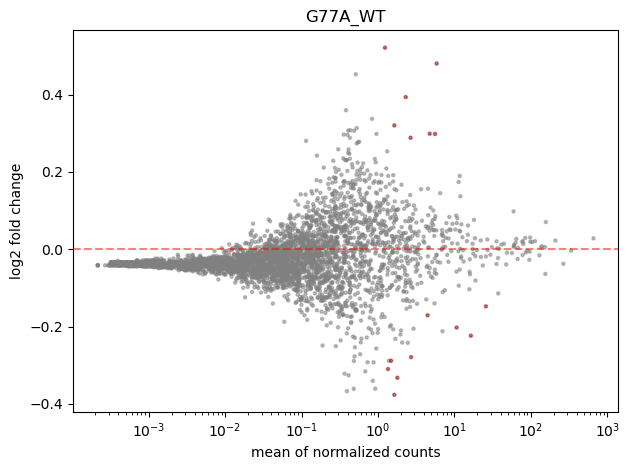

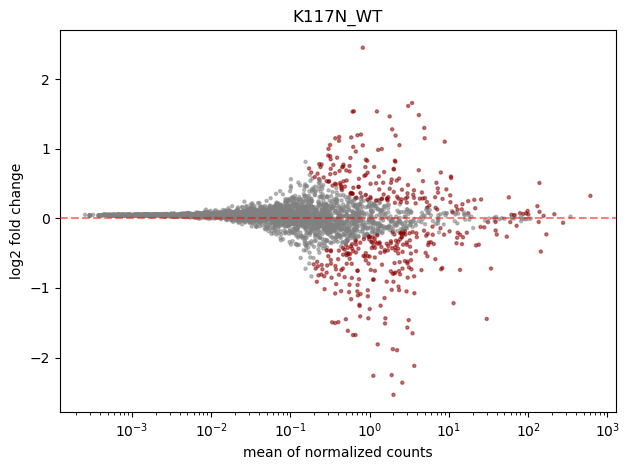

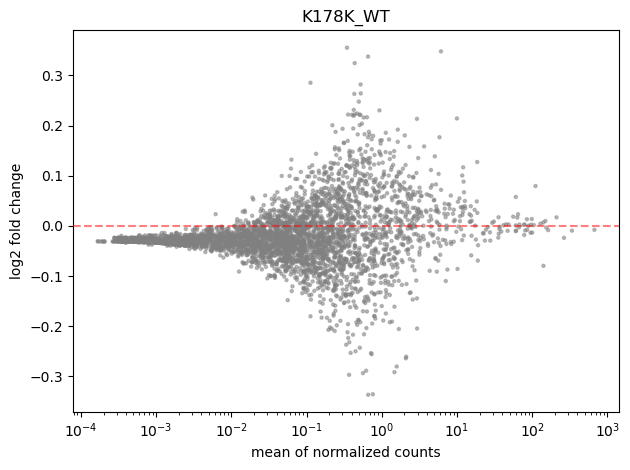

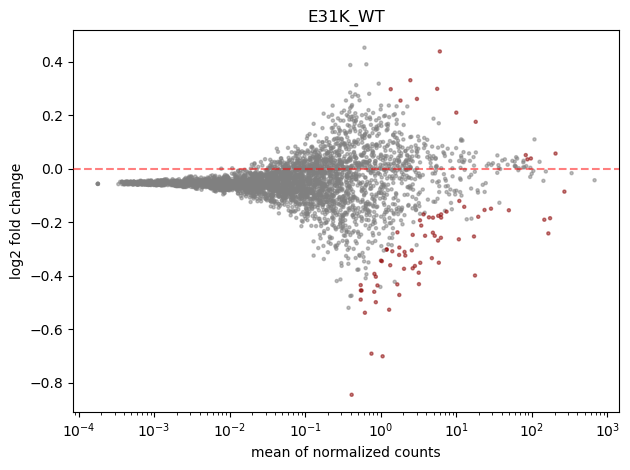

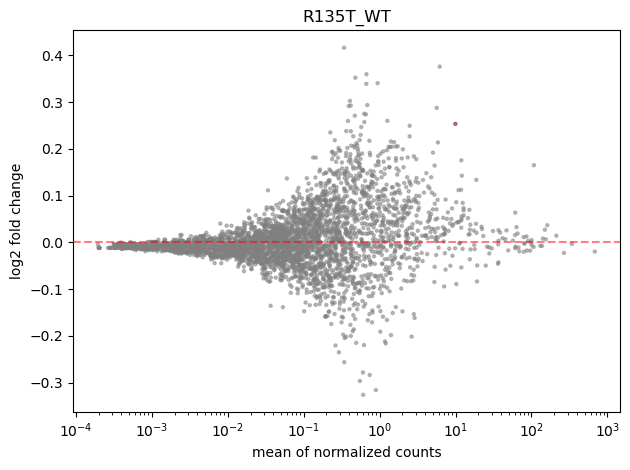

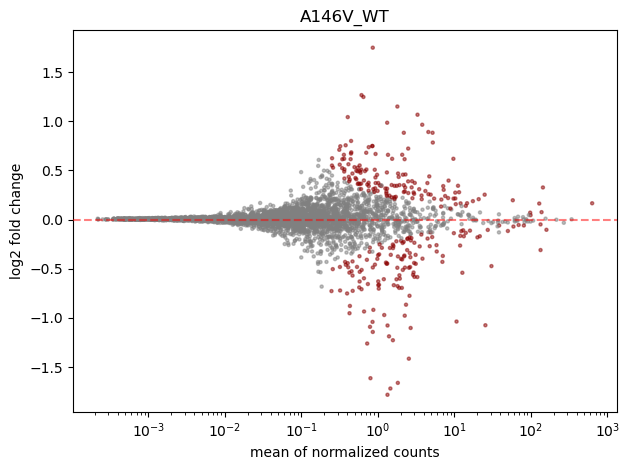

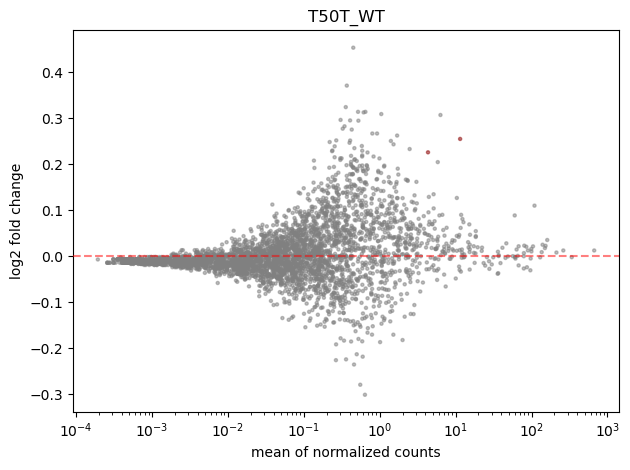

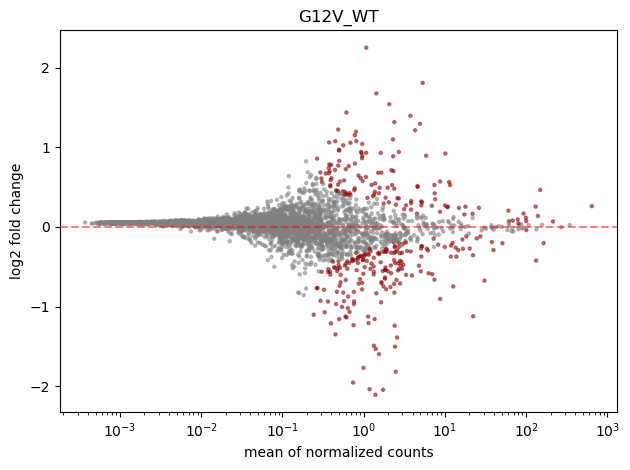

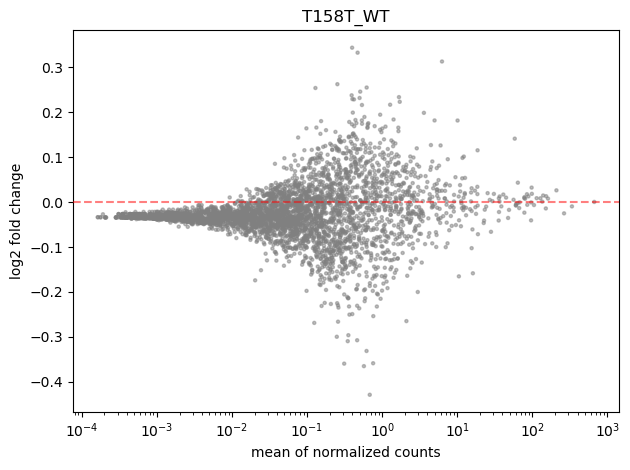

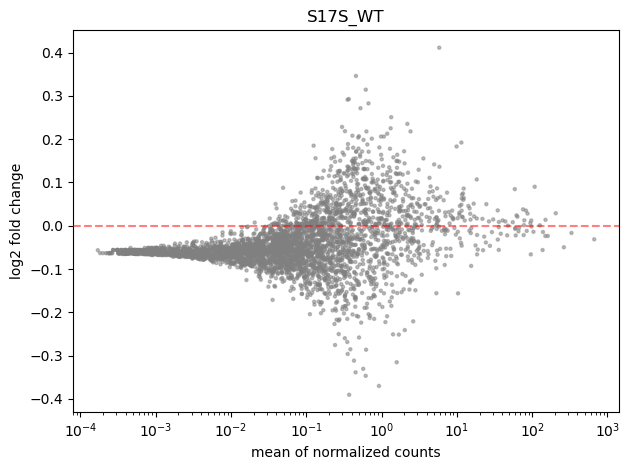

In [26]:
# Plotting the DEA
pseq.plot_dea(adata_dict)